In [1]:
%load_ext autoreload
%autoreload 2
%pylab inline

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
import warnings
warnings.filterwarnings("ignore")

from SCCAF import *
import scvi

from glob import iglob
from tqdm import tqdm
import scanpy as sc

[rank: 0] Global seed set to 0


In [3]:
def cluster_small_multiples(
    adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        try:
            tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]
        except:
            pass

    sc.pl.umap(
        tmp,
        groups=tmp.obs[clust].cat.categories[1:].values,
        color= adata.obs[clust_key].cat.categories.tolist(),
        size=size,
        frameon=frameon,
        legend_loc=legend_loc,
        **kwargs,
    )

In [4]:
def msample(x, n, frac):
    """
    sample the matrix by number or by fraction.
    if the fraction is larger than the sample number, use number for sampling. Otherwise, use fraction.
    Input
    -----
    x: the matrix to be split
    n: number of vectors to be sampled
    frac: fraction of the total matrix to be sampled
    return
    -----
    sampled selection.
    """
    if len(x) <= np.floor(n / frac):
        if len(x) < 10: frac = 0.9
        return x.sample(frac=frac)
    else:
        return x.sample(n=n)

In [5]:
import pickle

In [6]:
from glob import iglob 

In [7]:
import numpy as np
import scanpy as sc
import scvi

In [8]:
from scAnnot.core import *

# model accuracy

In [17]:
tmp=pd.read_csv('/home/huang_yin/projA/scBERT/data/results/whole_brain_sub_genes_overlap_with_other_dataset_obs_celltype.csv')

In [9]:
tmp1=pd.read_csv('/home/huang_yin/projA/data/scvi/whole_brain_sub_genes_overlap_with_other_dataset.csv')

In [10]:
np.random.seed(0)
unlabel_idx=np.sort(np.random.choice(range(tmp1.shape[0]),int(tmp1.shape[0]*0.2),replace=False))

In [11]:
tmp1['unlabel']=False

In [12]:
tmp1['unlabel'][unlabel_idx]=True

In [13]:
sum(tmp1.unlabel)

673843

In [14]:
sum(~tmp1.unlabel)

2695376

In [15]:
673843/(2695376+673843)

0.1999997625562482

In [18]:
tmp1['predict']=tmp1.predict_level1
tmp1['Supercluster']=tmp['Supercluster']

In [36]:
tmp1

,Unnamed: 0,predict_level1,predict_level2,unlabel,predict,Supercluster
0,10X376_7:GAACGTTGTATCGCTA-0,Miscellaneous,Miscellaneous-3,False,Miscellaneous,Miscellaneous
1,10X376_8:GAATCGTTCGATACGT-0,Miscellaneous,Miscellaneous-3,True,Miscellaneous,Miscellaneous
2,10X393_5:GCGTTTCCATAGATGA-0,Miscellaneous,Miscellaneous-3,True,Miscellaneous,Miscellaneous
3,10X377_4:CTCAACCTCATTTCCA-0,Miscellaneous,Miscellaneous-3,False,Miscellaneous,Miscellaneous
4,10X220_8:CGGGACTTCGGTGAAG-0,Miscellaneous,Miscellaneous-3,True,Miscellaneous,Miscellaneous
...,...,...,...,...,...,...
3369214,10X362_2:TCACACCGTGAGTGAC-0,Thalamic excitatory,Thalamic excitatory-460,True,Thalamic excitatory,Thalamic excitatory
3369215,10X362_2:TATCAGGTCAATCTTC-0,Thalamic excitatory,Thalamic excitatory-460,False,Thalamic excitatory,Thalamic excitatory
3369216,10X361_4:TCCCAGTAGTGATGGC-0,Thalamic excitatory,Thalamic excitatory-460,False,Thalamic excitatory,Thalamic excitatory
3369217,10X377_1:GATCAGTAGATGAATC-0,Thalamic excitatory,Thalamic excitatory-460,False,Thalamic excitatory,Thalamic excitatory


### validation accuracy

In [20]:
sum((tmp1.Supercluster==tmp1.predict)[tmp1.unlabel])/sum(tmp1.unlabel)

0.9827274305735906

### training accuracy

In [21]:
sum((tmp1.Supercluster==tmp1.predict)[~tmp1.unlabel])/sum(~tmp1.unlabel)

0.9829574797727664

### confusion matrix

In [22]:
df = tmp1[tmp1.unlabel].groupby(["Supercluster", "predict"]).size().unstack(fill_value=0)

In [23]:
conf_mat = df / df.sum(axis=1).values[:, np.newaxis]

In [24]:
conf_mat.max(axis=0).min()

0.9316905642687537

In [31]:
conf_mat=conf_mat.loc[idx[::-1],idx]

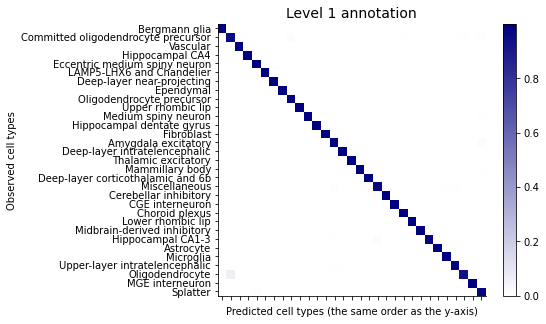

In [34]:
colors = ['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a']
cmap = mcolors.ListedColormap(colors)
color_stops = [(0.0, (1.0, 1.0, 1.0)),  # white
               (1.0, (0.0, 0.0, 0.5))]  # deep blue

# create the custom colormap using LinearSegmentedColormap
cmap = mcolors.LinearSegmentedColormap.from_list('custom', color_stops)

fig, ax = plt.subplots(figsize=(6, 5))
#plt.figure(figsize=(8, 8))
pcolor = plt.pcolor(conf_mat,cmap=cmap)
_ = plt.xticks(np.arange(0.5, len(conf_mat.columns), 1), conf_mat.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(conf_mat.index), 1), conf_mat.index)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
# remove the x-tick labels
_ = ax.set_xticklabels([])
title=ax.set_title("Level 1 annotation")
title.set_fontsize(14)
ax.set_xlabel("Predicted cell types (the same order as the y-axis)")
ax.set_ylabel("Observed cell types")
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("bottom", size="5%", pad=0.3)

fig.colorbar(pcolor)#, cax=cax, orientation='horizontal')
#plt.xlabel(" ")
#plt.ylabel(" ")
#plt.savefig('figures/adult_scAnnot_model_accuracy_v1.pdf',dpi=300, bbox_inches='tight',transparent=True)

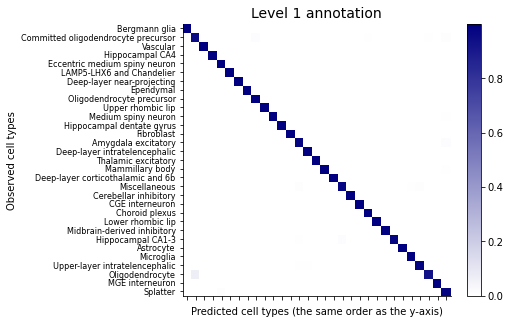

In [35]:
fig, ax = plt.subplots(figsize=(6, 5))
#plt.figure(figsize=(8, 8))
pcolor = plt.pcolor(conf_mat,cmap=cmap)
_ = plt.xticks(np.arange(0.5, len(conf_mat.columns), 1), conf_mat.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(conf_mat.index), 1), conf_mat.index)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
# remove the x-tick labels
_ = ax.set_xticklabels([])
title=ax.set_title("Level 1 annotation")
title.set_fontsize(14)
ax.set_xlabel("Predicted cell types (the same order as the y-axis)")
ax.set_ylabel("Observed cell types")
#divider = make_axes_locatable(ax)
#cax = divider.append_axes("bottom", size="5%", pad=0.3)
ax.set_yticklabels(ax.get_yticklabels(), fontsize=8)
fig.colorbar(pcolor)#, cax=cax, orientation='horizontal')
#plt.xlabel(" ")
#plt.ylabel(" ")
plt.savefig('figures/adult_scAnnot_model_accuracy_v1.pdf',dpi=300, bbox_inches='tight',transparent=True)

# sub model accuracy

In [25]:
df=pd.DataFrame({'Amygdala excitatory': [0.9289101150554712, 0.8979433626704364],
 'Astrocyte': [0.8683225504590116, 0.8187232398673663],
 'Bergmann glia': [1.0, 1.0],
 'CGE interneuron': [0.9046698695950584, 0.8808896500241514],
 'Cerebellar inhibitory': [0.9104257167680277, 0.9055498104102033],
 'Choroid plexus': [0.8988727332135272, 0.7219387755102041],
 'Committed oligodendrocyte precursor': [0.971413585103593,
  0.9007717750826902],
 'Deep-layer corticothalamic and 6b': [0.910805138641567, 0.8632903225806452],
 'Deep-layer intratelencephalic': [0.9228662361067744, 0.8983098836956048],
 'Deep-layer near-projecting': [0.9561122244488978, 0.8587236232629953],
 'Eccentric medium spiny neuron': [0.9634686116825635, 0.8877449764326469],
 'Ependymal': [0.9465116279069767, 0.7690972222222222],
 'Fibroblast': [0.9304834744605299, 0.7824427480916031],
 'Hippocampal CA1-3': [0.8782948963450171, 0.8262530152774055],
 'Hippocampal CA4': [0.9655091506335054, 0.8539906103286385],
 'Hippocampal dentate gyrus': [0.9323015975860346, 0.8534852745301169],
 'LAMP5-LHX6 and Chandelier': [0.9596917276557995, 0.8753040017687376],
 'Lower rhombic lip': [0.8933655463180085, 0.8016489310708466],
 'MGE interneuron': [0.7823596792668958, 0.7570700464570835],
 'Mammillary body': [0.912536884315654, 0.7293943870014771],
 'Medium spiny neuron': [0.9358484376281473, 0.8930566112561552],
 'Microglia': [0.8341813135985199, 0.7069285324604474],
 'Midbrain-derived inhibitory': [0.888988458659944, 0.8140207656336689],
 'Miscellaneous': [0.9105799683293745, 0.900472959078758],
 'Oligodendrocyte': [0.8325355313055476, 0.7790414462889929],
 'Oligodendrocyte precursor': [0.9430366269165247, 0.8469301141186457],
 'Splatter': [0.5017632674074392, 0.49222886131113497],
 'Thalamic excitatory': [0.9223950664081293, 0.9213801238572692],
 'Upper rhombic lip': [0.9363666216659977, 0.8895184135977338],
 'Upper-layer intratelencephalic': [0.8331969014394023, 0.8125343534947123],
 'Vascular': [0.9688956050875205, 0.8794575590155701]})

In [26]:
df=df.T

In [27]:
df = df.sort_values(by=0,ascending=False)

In [28]:
df

,0,1
Bergmann glia,1.000000,1.000000
Committed oligodendrocyte precursor,0.971414,0.900772
Vascular,0.968896,0.879458
Hippocampal CA4,0.965509,0.853991
Eccentric medium spiny neuron,0.963469,0.887745
LAMP5-LHX6 and Chandelier,0.959692,0.875304
Deep-layer near-projecting,0.956112,0.858724
Ependymal,0.946512,0.769097
Oligodendrocyte precursor,0.943037,0.846930
Upper rhombic lip,0.936367,0.889518


In [29]:
df.mean(axis=0)

0    0.901442
1    0.832843
dtype: float64

In [30]:
idx=list(df.index)

In [ ]:
df=pd.DataFrame([list(df.index)*2,list(df[0])+list(df[1]),['training']*df.shape[0]+['validation']*df.shape[0]])

In [ ]:
df=df.T
df.columns=['celltype','accuracy','data']

In [ ]:
df_submodel=df

In [ ]:
df=df_submodel

<matplotlib.legend.Legend>

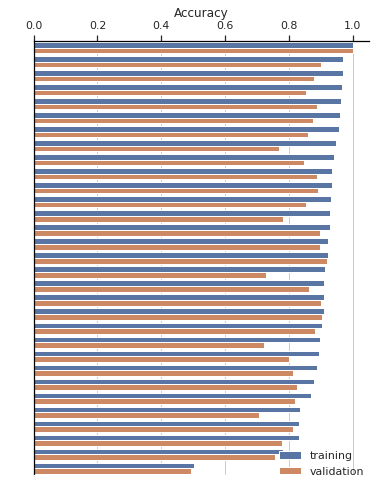

In [ ]:
figsize(6,8)
# create the bar plot with seaborn
sns.set(style="whitegrid")
ax = sns.barplot(data=df,y='celltype',x='accuracy',hue='data')

# set the plot title and axis labels
#ax.set_title("Bar Plot of Accuracy")
ax.set_xlabel("Accuracy")
ax.set_ylabel(" ")
ax.spines['top'].set_color('black')
ax.spines['left'].set_color('black')
ax.spines['bottom'].set_color('white')
ax.spines['right'].set_color('white')
ax.xaxis.set_ticks_position('top')
ax.xaxis.set_label_position('top')
_ = ax.set_yticklabels([])
plt.legend(loc='lower center', bbox_to_anchor=(0.86, -0.025),frameon=False)
#plt.xticks(rotation=90)
# display the plot
#sns.despine()
#plt.savefig('figures/scAnnot_sub_model_accuracy.pdf')

In [ ]:
6/8*5

3.75

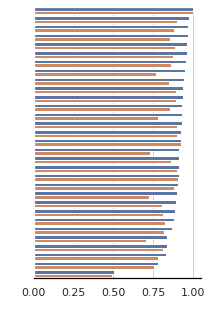

In [ ]:
figsize(3,5)
# create the bar plot with seaborn
sns.set(style="whitegrid")
ax = sns.barplot(data=df,y='celltype',x='accuracy',hue='data')

# set the plot title and axis labels
#ax.set_title("Bar Plot of Accuracy")
ax.set_xlabel(" ")
ax.set_ylabel(" ")
ax.spines['top'].set_color('white')
ax.spines['left'].set_color('white')
ax.spines['bottom'].set_color('black')
ax.spines['right'].set_color('white')
#ax.xaxis.set_ticks_position('top')
#ax.xaxis.set_label_position('top')
_ = ax.set_yticklabels([])
ax.get_legend().remove()
#plt.legend(loc='lower center', bbox_to_anchor=(0.86, -0.025),frameon=False)
#plt.xticks(rotation=90)
# display the plot
#sns.despine()
plt.savefig('figures/adult_scAnnot_sub_model_accuracy.pdf',dpi=300, bbox_inches='tight',transparent=True)

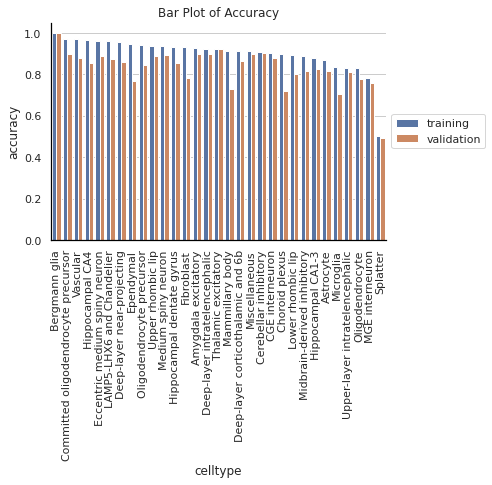

In [ ]:
# create the bar plot with seaborn
sns.set(style="whitegrid")
ax = sns.barplot(data=df,y='accuracy',x='celltype',hue='data')

# set the plot title and axis labels
ax.set_title("Bar Plot of Accuracy")
#ax.set_xlabel("Groups")
#ax.set_ylabel("Values")
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.xticks(rotation=90)
# display the plot
sns.despine()

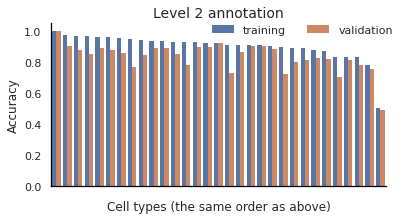

In [ ]:
figsize(6,3)
# create the bar plot with seaborn
#sns.set(style="whitegrid")
ax = sns.barplot(data=df,y='accuracy',x='celltype',hue='data',linewidth=0)

# set the plot title and axis labels
_ = ax.set_xticklabels([])
title=ax.set_title("Level 2 annotation")
title.set_fontsize(14)

ax.set_xlabel("Cell types (the same order as above)")
ax.set_ylabel("Accuracy")
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_color('black')
ax.set_facecolor('none')
plt.legend(loc='upper center', bbox_to_anchor=(0.75, 1.05), ncol=2,frameon=False)
#plt.legend(loc='lower center', bbox_to_anchor=(1.0, 0.5))
plt.xticks(rotation=90)
plt.grid(False)
# display the plot
sns.despine(top=True, right=True)
plt.savefig('figures/adult_scAnnot_sub_model_accuracy_v1.pdf',dpi=300, bbox_inches='tight',transparent=True)

# Prediction on datasets with labels (ground truth)

### Prediction of human_brain_entorhinalcortex_Grubman_2019_DroNc-seq

In [ ]:
new_ad=sc.read('/home/huang_ziliang/project/brain/data/public/human_brain_entorhinalcortex_Grubman_2019_DroNc-seq/h5/annot.h5ad')

In [ ]:
genes=list(adata.var.index)

In [ ]:
new_ad=new_ad[:,genes]

In [ ]:
new_ad.obs["celltype_scanvi"] = "Unknown"

In [ ]:
new_ad

AnnData object with n_obs × n_vars = 12599 × 1841
    obs: 'oupSample.batchCond', 'oupSample.cellType', 'oupSample.cellType_batchCond', 'oupSample.subclustID', 'oupSample.subclustCond', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'sample', 'leiden', 'cell_ID', 'seq_tech', 'original_name', 'original_name2', 'reference', 'organ', 'species', 'sample_type', 'donor_status', 'sample_status', 'treatment', 'seq_method', 'project_code', 'region', 'ethnicity', 'if_patient', 'subregion', 'donor_ID', 'donor_age', 'donor_gender', 'sample_ID', 'Siletti_singleCellNet', 'Siletti_SingleR', 'Siletti_scPred', 'Siletti_scMap', 'Siletti_CHETAH', 'Siletti_scArches', 'Siletti_ACTINN', 'Siletti_modf_SCANVI_L1', 'Siletti_modf_SCANVI_L2', 'cell_type', 'celltype_scanvi'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'hig

In [ ]:
new_ad_obs=new_ad.obs[['oupSample.cellType','oupSample.subclustID']]

In [ ]:
new_ad_obs

,oupSample.cellType,oupSample.subclustID
AAACCTGGTAGAAAGG_AD5_AD6,oligo,o3
AAACCTGGTAGCGATG_AD5_AD6,oligo,o3
AAACCTGTCAGTCAGT_AD5_AD6,oligo,o3
AAACCTGTCCAAACAC_AD5_AD6,oligo,o3
AAACCTGTCCAGTATG_AD5_AD6,oligo,o3
...,...,...
TTTGGTTCATCGGACC_AD1_AD2,unID,u5
TTTGGTTTCCCAGGTG_AD1_AD2,oligo,o1
TTTGTCACAAGCCATT_AD1_AD2,doublet,d2
TTTGTCAGTATAGGTA_AD1_AD2,doublet,d4


In [ ]:
pred_labels=lvae_all.predict(new_ad)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [ ]:
pred_labels

array(['Committed oligodendrocyte precursor',
       'Committed oligodendrocyte precursor',
       'Committed oligodendrocyte precursor', ...,
       'Committed oligodendrocyte precursor',
       'Committed oligodendrocyte precursor',
       'Committed oligodendrocyte precursor'], dtype='<U35')

In [ ]:
new_ad_obs['predict']=pred_labels

In [ ]:
new_ad_obs

,oupSample.cellType,oupSample.subclustID,predict
AAACCTGGTAGAAAGG_AD5_AD6,oligo,o3,Committed oligodendrocyte precursor
AAACCTGGTAGCGATG_AD5_AD6,oligo,o3,Committed oligodendrocyte precursor
AAACCTGTCAGTCAGT_AD5_AD6,oligo,o3,Committed oligodendrocyte precursor
AAACCTGTCCAAACAC_AD5_AD6,oligo,o3,Committed oligodendrocyte precursor
AAACCTGTCCAGTATG_AD5_AD6,oligo,o3,Committed oligodendrocyte precursor
...,...,...,...
TTTGGTTCATCGGACC_AD1_AD2,unID,u5,Microglia
TTTGGTTTCCCAGGTG_AD1_AD2,oligo,o1,Committed oligodendrocyte precursor
TTTGTCACAAGCCATT_AD1_AD2,doublet,d2,Committed oligodendrocyte precursor
TTTGTCAGTATAGGTA_AD1_AD2,doublet,d4,Committed oligodendrocyte precursor


In [ ]:
df = new_ad_obs.groupby(['oupSample.cellType', 'predict']).size().unstack(fill_value=0)

In [ ]:
conf_mat = df / df.sum(axis=1).values[:, np.newaxis]

Text(0, 0.5, 'Observed')

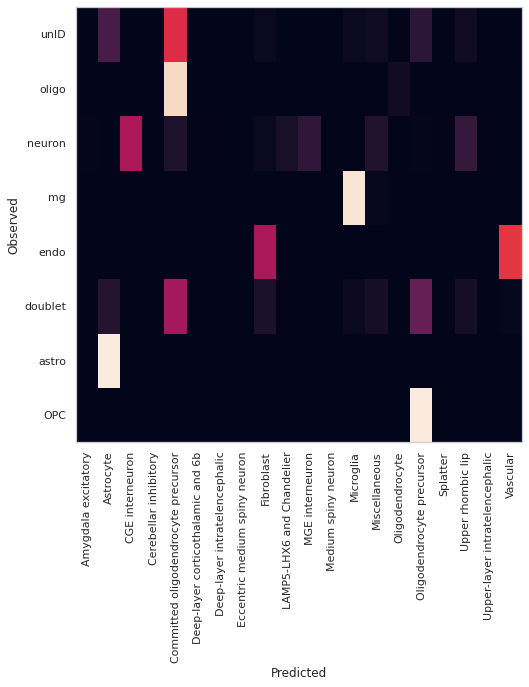

In [ ]:
plt.figure(figsize=(8, 8))
_ = plt.pcolor(conf_mat)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

In [ ]:
new_ad.obs['predict']=pred_labels

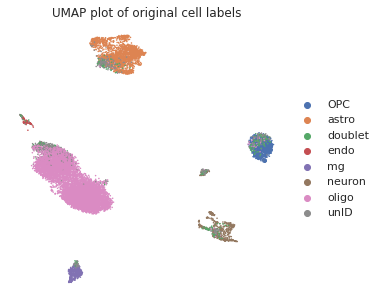

In [ ]:
figsize(5,5)
sc.pl.umap(new_ad,color=['oupSample.cellType'],frameon=False,title="Original Labels")

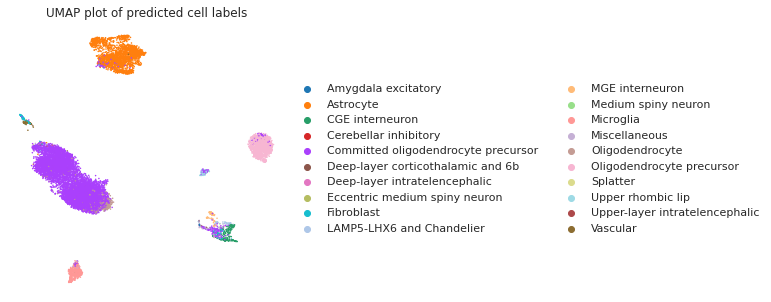

In [ ]:
figsize(5,5)
sc.pl.umap(new_ad,color=['predict'],frameon=False,title="Predicted Labels")

In [ ]:
new_ad.obs.to_csv('/home/huang_yin/projA/scBERT/data/results/human_brain_entorhinalcortex_Grubman_2019_DroNc-seq_obs_celltype.csv')

### Prediction of human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq

In [ ]:
new_ad=sc.read('/home/huang_ziliang/project/brain/data/public/human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq/h5/ftOutlier_annot.h5ad')

In [ ]:
new_ad1=sc.read('/home/huang_ziliang/project/brain/data/public/human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq/h5/ftOutlier_annot.h5ad')

ERROR! Session/line number was not unique in database. History logging moved to new session 432


In [ ]:
new_ad=new_ad[:,genes]

In [ ]:
new_ad

AnnData object with n_obs × n_vars = 47432 × 1841
    obs: 'exp_component_name', 'specimen_type', 'cluster_color', 'cluster_order', 'cluster_label', 'class_color', 'class_order', 'class_label', 'subclass_color', 'subclass_order', 'subclass_label', 'full_genotype_color', 'full_genotype_order', 'full_genotype_label', 'donor_sex_color', 'donor_sex_order', 'donor_sex_label', 'region_color', 'region_order', 'region_label', 'cortical_layer_color', 'cortical_layer_order', 'cortical_layer_label', 'cell_type_accession_color', 'cell_type_accession_order', 'cell_type_accession_label', 'cell_type_alias_color', 'cell_type_order', 'cell_type_alias_label', 'cell_type_alt_alias_color', 'cell_type_alt_alias_order', 'cell_type_alt_alias_label', 'cell_type_designation_color', 'cell_type_designation_order', 'cell_type_designation_label', 'external_donor_name_color', 'external_donor_name_order', 'external_donor_name_label', 'outlier_call', 'outlier_type', 'n_genes_by_counts', 'total_counts', 'total_counts_

In [ ]:
new_ad.obs["celltype_scanvi"] = "Unknown"

In [ ]:
new_ad.obs['predict']=lvae_all.predict(new_ad)

INFO     Input AnnData not setup with scvi-tools. attempting to transfer AnnData setup                             


In [ ]:
new_ad.obs['predict1']=new_ad1.obs.Siletti_modf_SCANVI_L2

In [ ]:
sum(new_ad.obs.predict==new_ad1.obs.Siletti_modf_SCANVI_L1)

47432

In [ ]:
new_ad

AnnData object with n_obs × n_vars = 47432 × 1841
    obs: 'exp_component_name', 'specimen_type', 'cluster_color', 'cluster_order', 'cluster_label', 'class_color', 'class_order', 'class_label', 'subclass_color', 'subclass_order', 'subclass_label', 'full_genotype_color', 'full_genotype_order', 'full_genotype_label', 'donor_sex_color', 'donor_sex_order', 'donor_sex_label', 'region_color', 'region_order', 'region_label', 'cortical_layer_color', 'cortical_layer_order', 'cortical_layer_label', 'cell_type_accession_color', 'cell_type_accession_order', 'cell_type_accession_label', 'cell_type_alias_color', 'cell_type_order', 'cell_type_alias_label', 'cell_type_alt_alias_color', 'cell_type_alt_alias_order', 'cell_type_alt_alias_label', 'cell_type_designation_color', 'cell_type_designation_order', 'cell_type_designation_label', 'external_donor_name_color', 'external_donor_name_order', 'external_donor_name_label', 'outlier_call', 'outlier_type', 'n_genes_by_counts', 'total_counts', 'total_counts_

In [ ]:
new_ad.obs.class_label

F2S4_160113_027_B01        GABAergic
F2S4_160113_027_C01        GABAergic
F2S4_160113_027_D01        GABAergic
F2S4_160113_027_E01        GABAergic
F2S4_160113_027_F01        GABAergic
                           ...      
F2S4_190227_100_C01     Non-neuronal
F2S4_190227_100_E01    Glutamatergic
F2S4_190227_100_F01        GABAergic
F2S4_190227_100_G01     Non-neuronal
F2S4_190227_100_H01     Non-neuronal
Name: class_label, Length: 47432, dtype: category
Categories (3, object): ['GABAergic', 'Glutamatergic', 'Non-neuronal']

In [ ]:
df = new_ad.obs.groupby(['class_label', 'predict']).size().unstack(fill_value=0)

In [ ]:
conf_mat = df / df.sum(axis=1).values[:, np.newaxis]

Text(0, 0.5, 'Observed')

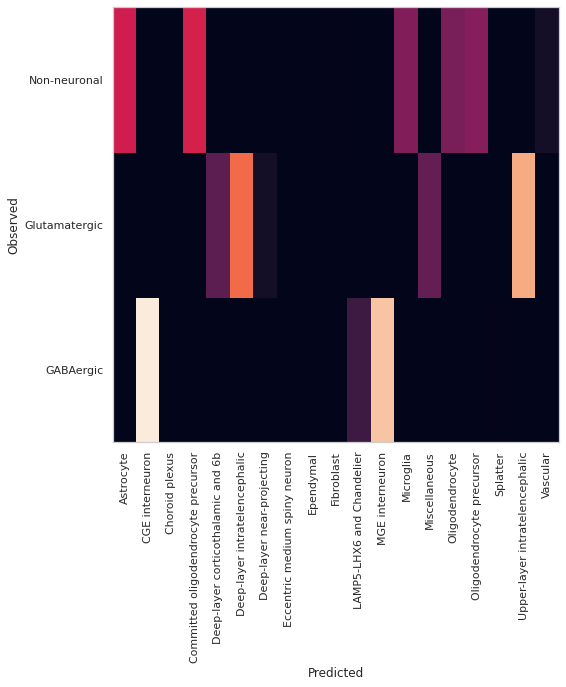

In [ ]:
plt.figure(figsize=(8, 8))
_ = plt.pcolor(conf_mat)
_ = plt.xticks(np.arange(0.5, len(df.columns), 1), df.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(df.index), 1), df.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")

In [ ]:
df = new_ad.obs.groupby(['subclass_label', 'predict']).size().unstack(fill_value=0)

In [ ]:
conf_mat = df / df.sum(axis=1).values[:, np.newaxis]

In [ ]:
conf_mat=conf_mat.sort_values(by=list(conf_mat.columns), axis=0)#,ascending=False)
conf_mat=conf_mat.sort_values(by=list(conf_mat.index), axis=1)#,ascending=True)

#conf_mat=conf_mat.loc[conf_mat.index[::-1],conf_mat.columns[::-1]]

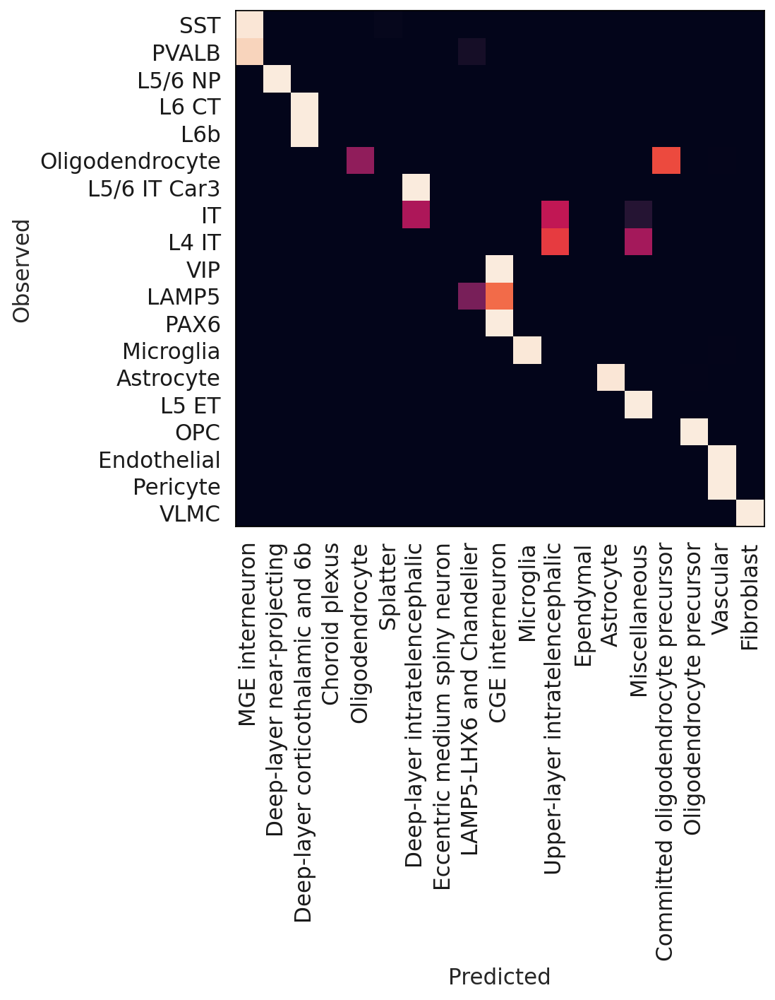

In [ ]:
plt.figure(figsize=(6, 6))
_ = plt.pcolor(conf_mat)
_ = plt.xticks(np.arange(0.5, len(conf_mat.columns), 1), conf_mat.columns, rotation=90)
_ = plt.yticks(np.arange(0.5, len(conf_mat.index), 1), conf_mat.index)
plt.xlabel("Predicted")
plt.ylabel("Observed")
plt.savefig('figures/conf_mat_human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_originalvspred.pdf')

## UMAP Original vs Predicted

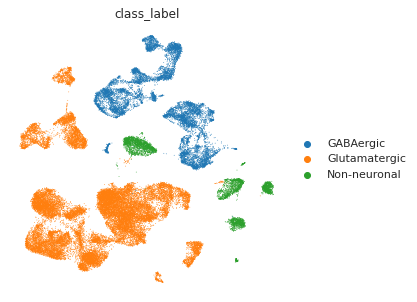

In [ ]:
figsize(5,5)
sc.pl.umap(new_ad,color=['class_label'],frameon=False)

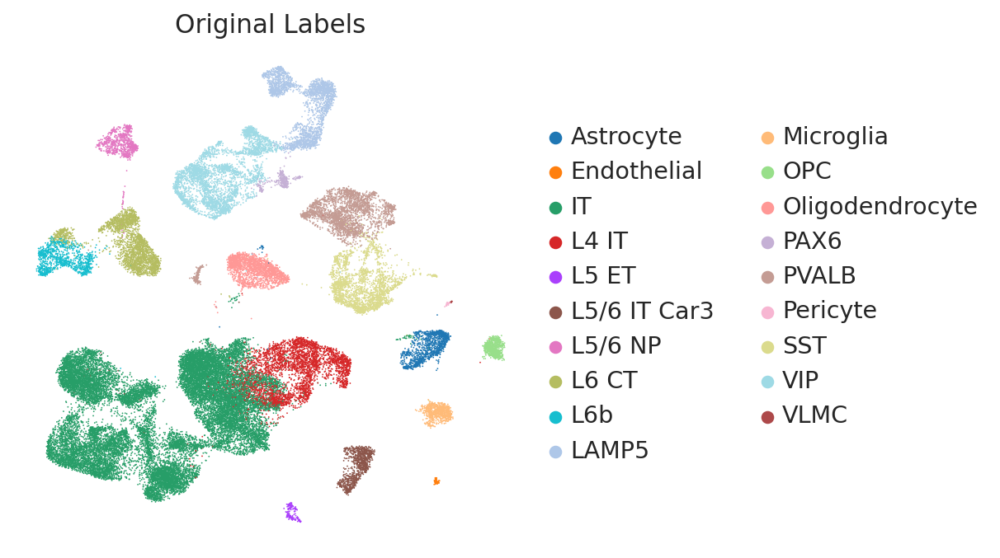

In [ ]:
sc.pl.umap(new_ad,color=['subclass_label'],frameon=False,title='Original Labels',save='human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_original.pdf')

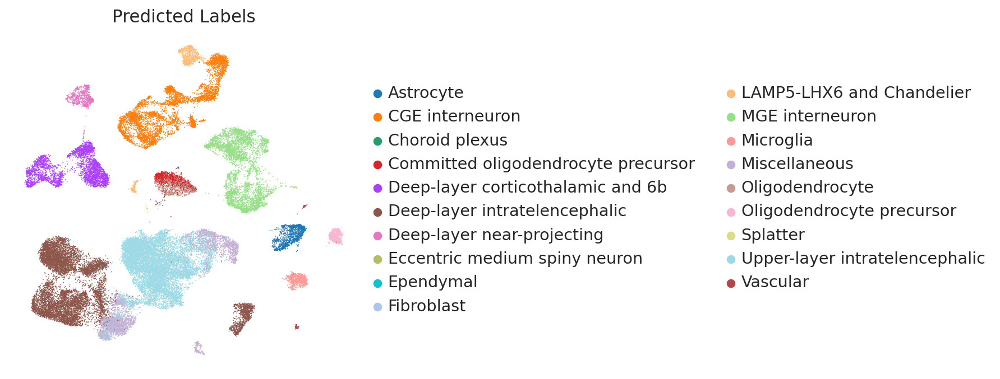

In [ ]:
figsize(5,5)
sc.pl.umap(new_ad,color=['predict'],frameon=False,title='Predicted Labels',save='human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_pred.pdf')

In [ ]:
col_dict = {'Committed oligodendrocyte precursor': '#00B8C3',
 'Oligodendrocyte precursor': '#006091',
 'Oligodendrocyte': '#5C89CC',
 'Oligo': '#74A0FF',
 'Astrocyte': '#AFE1AF',
 'Bergmann glia': '#005C07',
 'Midbrain-derived inhibitory': '#0BDA51',
 'Cerebellar inhibitory': '#B4C424',
 'LAMP5-LHX6 and Chandelier': '#53A39D',
 'Upper rhombic lip': '#FA8072',
 'Lower rhombic lip': '#FF7F50',
 'CGE interneuron': '#DE3163',
 'MGE interneuron': '#FF69B4',
 'Upper-layer intratelencephalic': '#FFDF11',
 'Deep-layer intratelencephalic': '#FFB307',
 'Thalamic excitatory': '#C77767',
 'Amygdala excitatory': '#DC143C',
 'Eccentric medium spiny neuron': '#FA5F55',
 'Medium spiny neuron': '#FF5F1F',
 'Deep-layer corticothalamic and 6b': '#AA336A',
 'Deep-layer near-projecting': '#F33A6A',
 'Choroid plexus': '#9440F3',
 'Hippocampal dentate gyrus': '#9900B3',
 'Hippocampal CA4': '#C266D1',
 'Hippocampal CA1-3': '#6C00BF',
 'Mammillary body': '#A700FF',
 'Neuron': '#D9C566',
 'Radial glia': '#FFB6C1',
 'Neuronal IPC': '#FF88AD',
 'Placodes': '#F3CFC6',
 'Neural crest': '#DD6091',
 'Glioblast': '#7779BF',
 'Neuroblast': '#FFA388',
 'Ependymal': '#475D4B',
 'Erythrocyte': '#802600',
 'Vascular': '#9A0F03',
 'Immune': '#966919',
 'Fibroblast': '#D2B48C',
 'Microglia': '#F0E68C',
 'Splatter': '#708090',
 'Miscellaneous': '#A9A9A9',
 'unannoted': '#231F20'}

In [ ]:
new_ad.uns['predict_colors']=[col_dict[i] for i in new_ad.obs.predict.cat.categories]

In [ ]:
new_ad.uns['predict_colors']

['#DE3163',
 '#FF69B4',
 '#AA336A',
 '#FFB307',
 '#F33A6A',
 '#FFDF11',
 '#53A39D',
 '#AFE1AF',
 '#00B8C3',
 '#5C89CC',
 '#006091',
 '#F0E68C',
 '#A9A9A9',
 '#9A0F03']

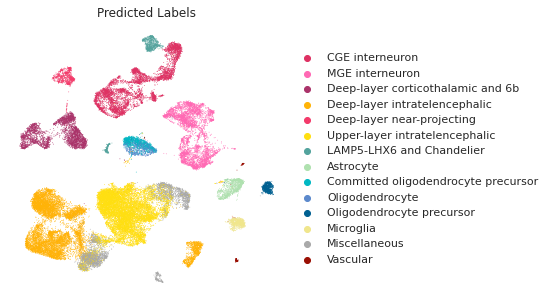

In [ ]:
figsize(5,5)
sc.pl.umap(new_ad,color=['predict'],frameon=False,title='Predicted Labels',save='human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_pred_cc.pdf')

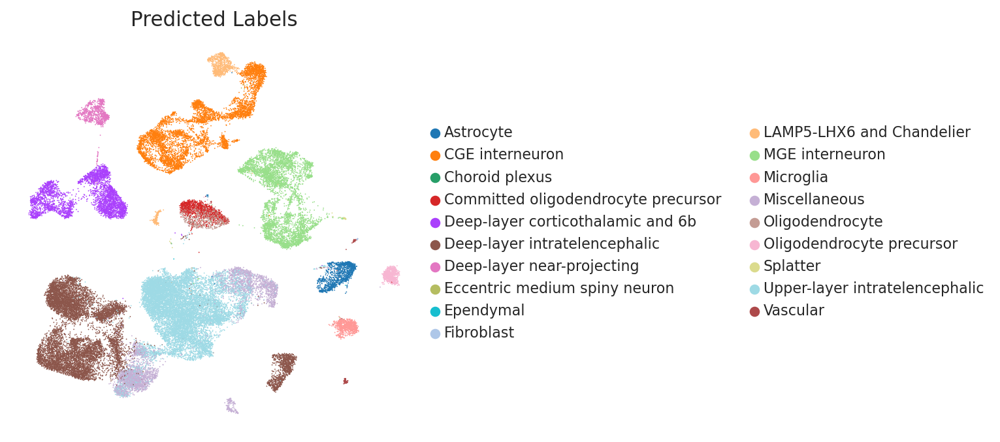

In [ ]:
figsize(5,5)
sc.pl.umap(new_ad,color=['predict'],frameon=False,title='Predicted Labels',legend_fontsize=10,legend_fontweight='light')#,save='human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_pred.pdf')

## UMAP for sub-celltype

In [ ]:
del new_ad.uns['predict1_colors']

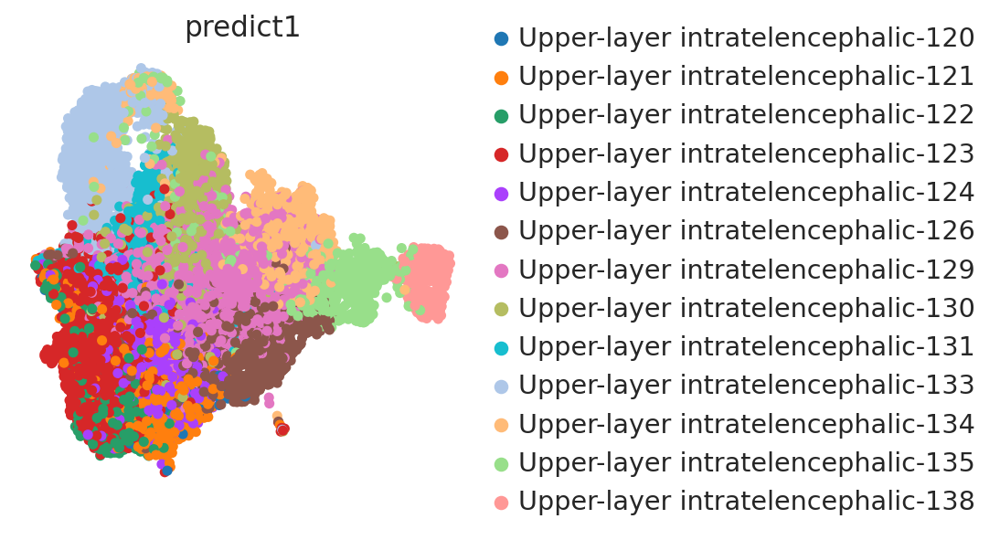

In [ ]:
sub_ad=new_ad[new_ad.obs.predict=='Upper-layer intratelencephalic'].copy()
sc.pp.neighbors(sub_ad)
sc.tl.umap(sub_ad)
sc.pl.umap(sub_ad,color=['predict1'],frameon=False,size=100)

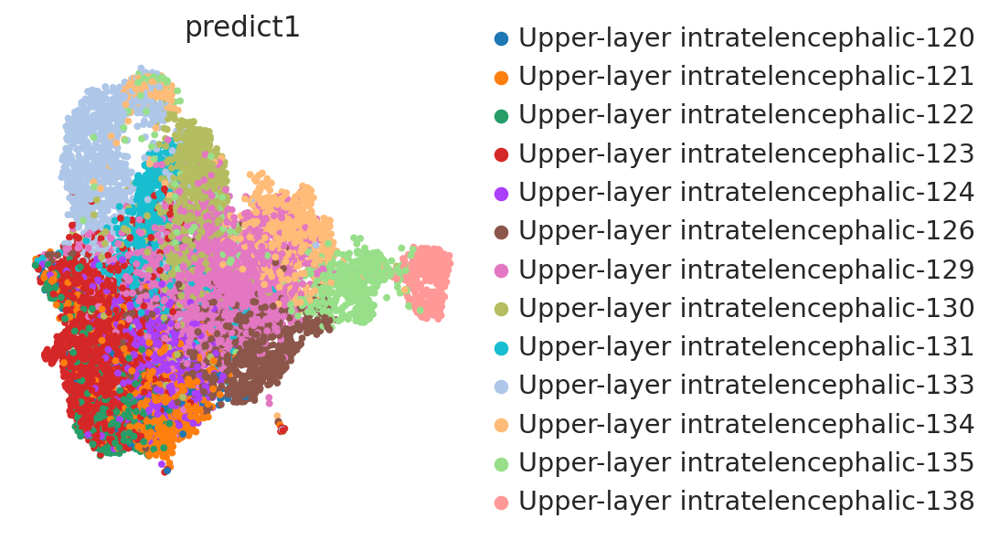

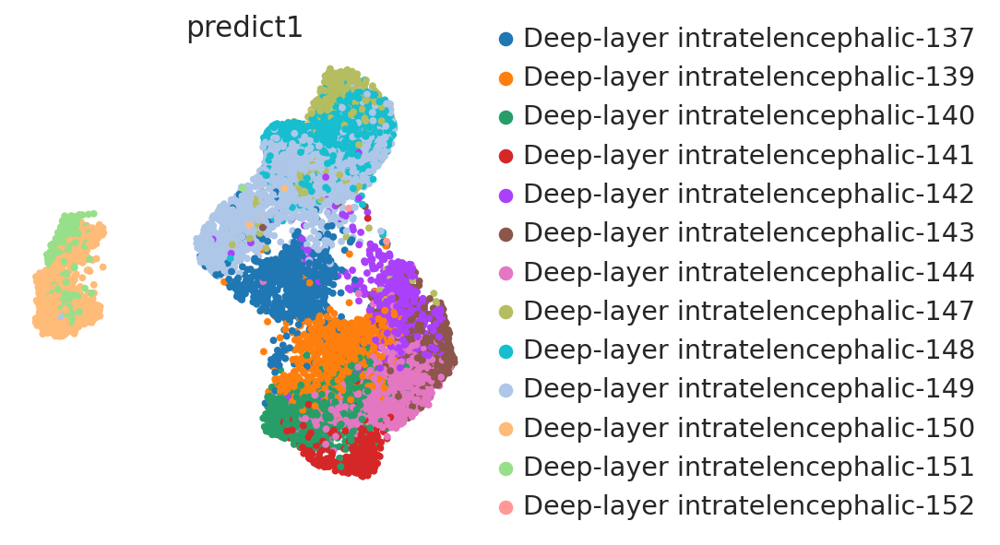

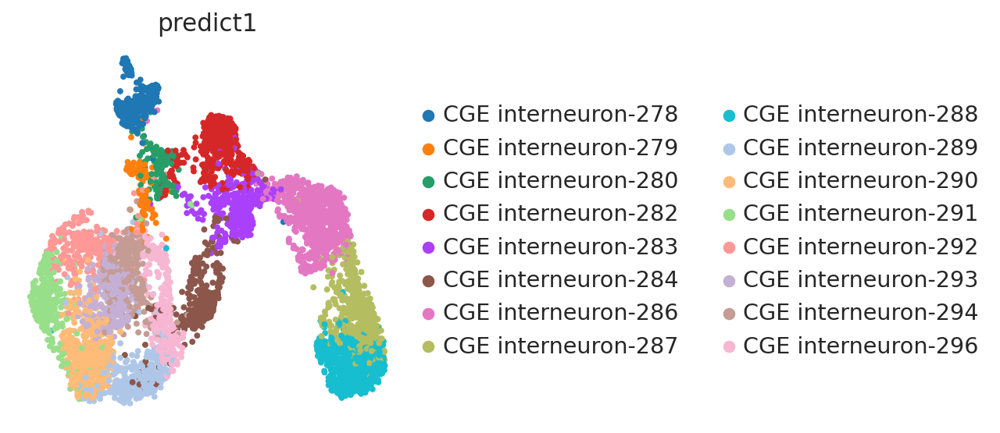

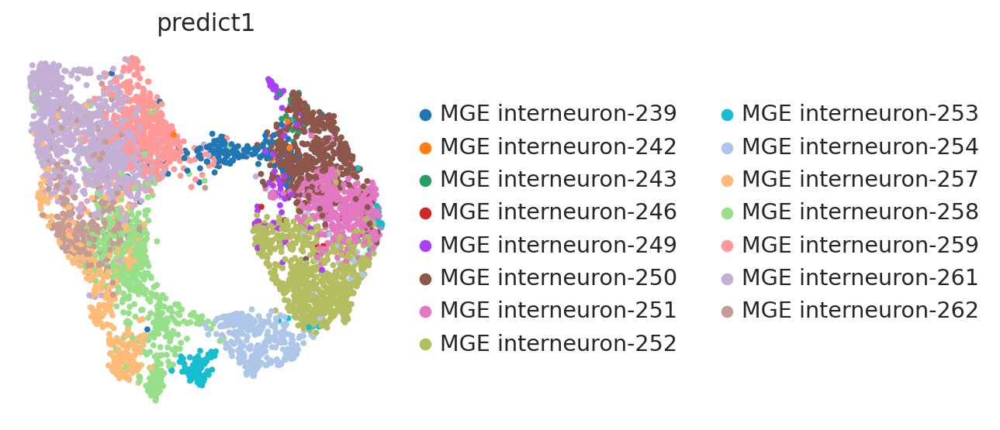

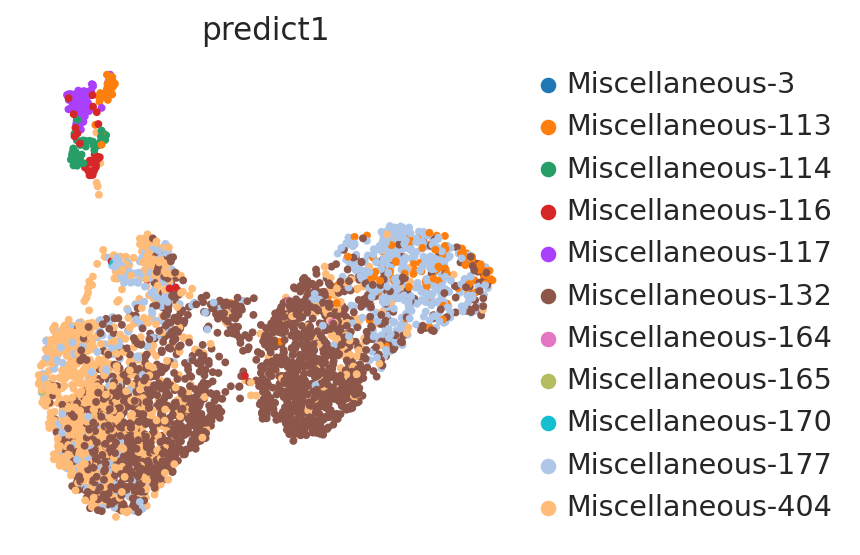

...

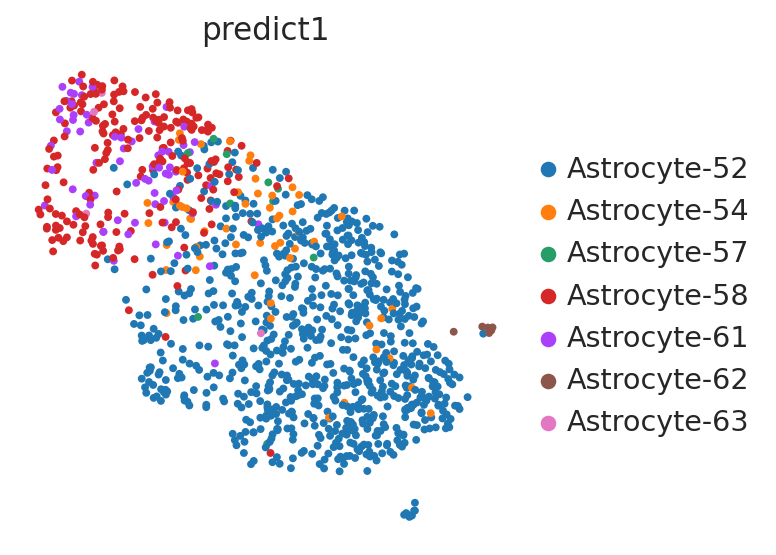

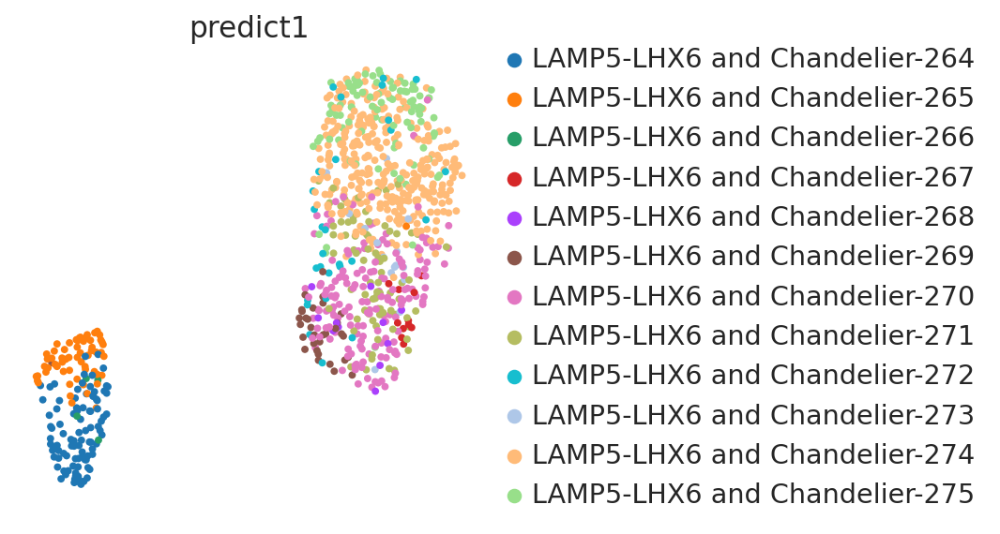

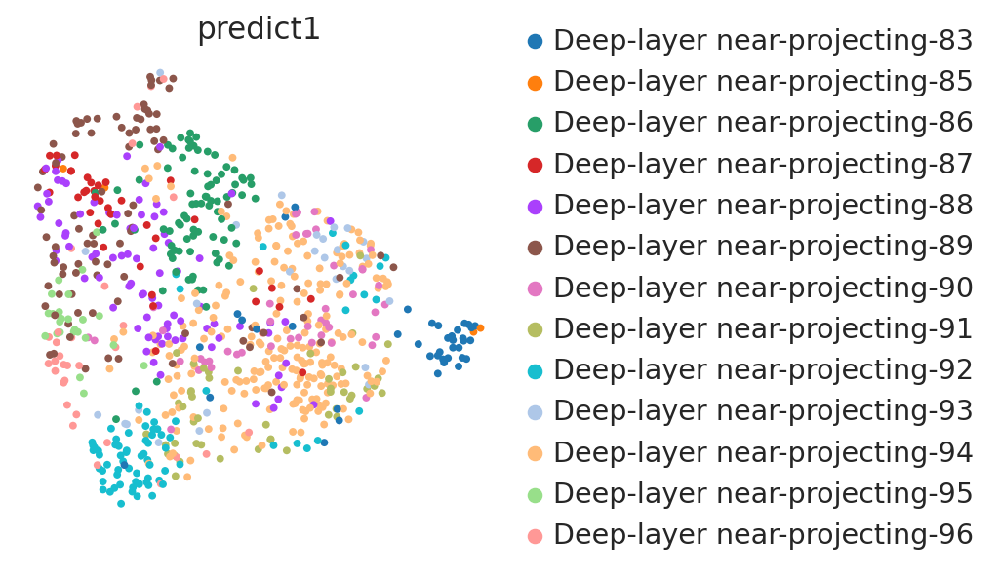

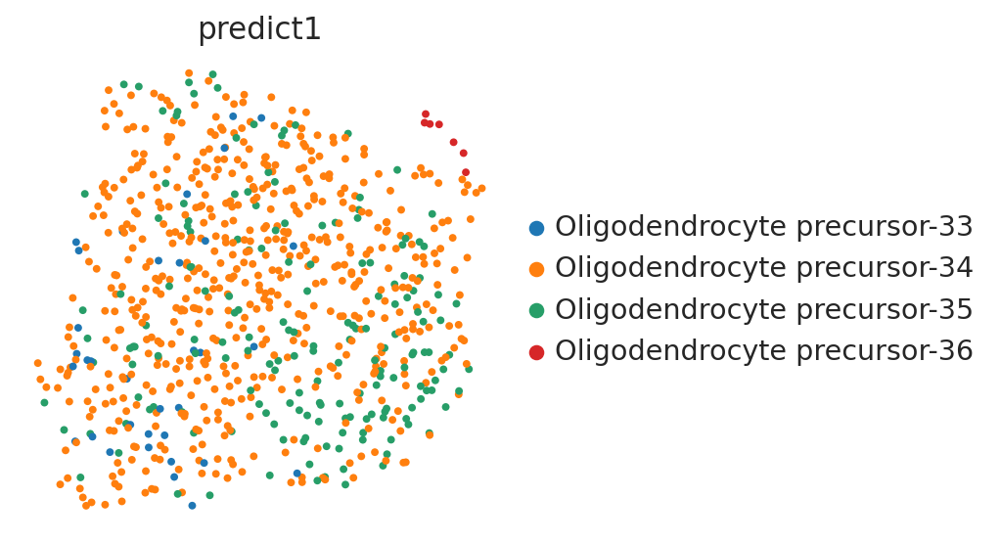

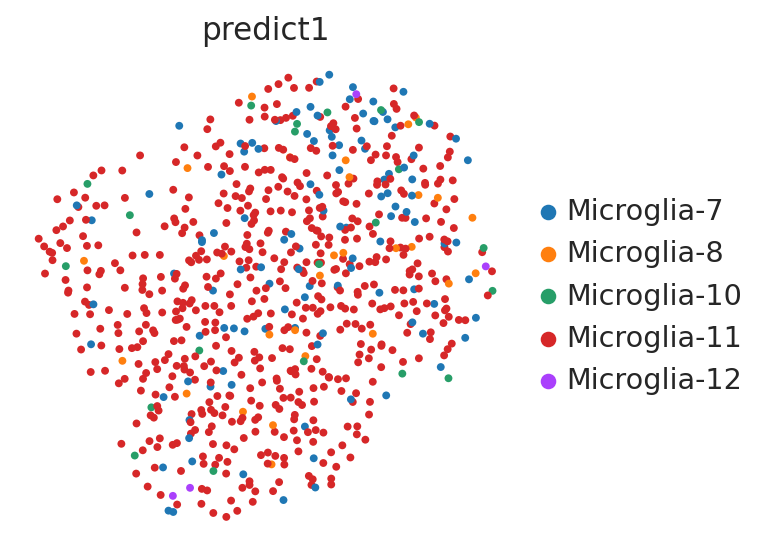

In [ ]:
for i in new_ad.obs.predict.value_counts().head(12).index:
    sub_ad=new_ad[new_ad.obs.predict==i].copy()
    sc.pp.neighbors(sub_ad)
    sc.tl.umap(sub_ad)
    sc.pl.umap(sub_ad,color=['predict1'],frameon=False,size=25)

In [ ]:
new_ad.obs.predict.value_counts().head(9).index

CategoricalIndex(['Upper-layer intratelencephalic',
                  'Deep-layer intratelencephalic', 'CGE interneuron',
                  'MGE interneuron', 'Miscellaneous',
                  'Deep-layer corticothalamic and 6b',
                  'Committed oligodendrocyte precursor', 'Astrocyte',
                  'LAMP5-LHX6 and Chandelier'],
                 categories=['Astrocyte', 'CGE interneuron', 'Choroid plexus', 'Committed oligodendrocyte precursor', 'Deep-layer corticothalamic and 6b', 'Deep-layer intratelencephalic', 'Deep-layer near-projecting', 'Eccentric medium spiny neuron', ...], ordered=False, dtype='category')

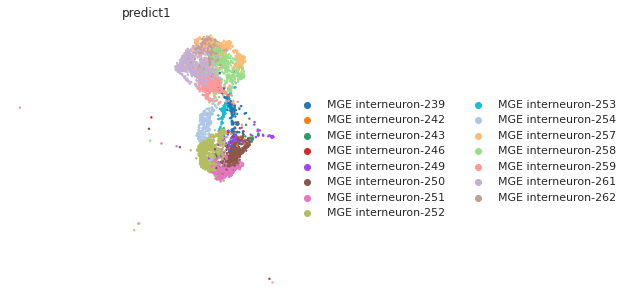

In [ ]:
sc.pl.umap(new_ad[new_ad.obs.predict=='MGE interneuron'],color=['predict1'],frameon=False)

## UMAP for sub-celltype with graduated colors

In [ ]:
new_ad.obs.predict

F2S4_160113_027_B01                  CGE interneuron
F2S4_160113_027_C01                  CGE interneuron
F2S4_160113_027_D01                  CGE interneuron
F2S4_160113_027_E01                  CGE interneuron
F2S4_160113_027_F01                  CGE interneuron
                                   ...              
F2S4_190227_100_C01                        Astrocyte
F2S4_190227_100_E01    Deep-layer intratelencephalic
F2S4_190227_100_F01                  CGE interneuron
F2S4_190227_100_G01                  Oligodendrocyte
F2S4_190227_100_H01                  Oligodendrocyte
Name: predict, Length: 47432, dtype: category
Categories (19, object): ['Astrocyte', 'CGE interneuron', 'Choroid plexus', 'Committed oligodendrocyte precursor', ..., 'Oligodendrocyte precursor', 'Splatter', 'Upper-layer intratelencephalic', 'Vascular']

In [ ]:
pred_len=[len(new_ad.obs.predict1[new_ad.obs.predict==i].unique()) for i in new_ad.obs.predict.cat.categories]

In [ ]:
pred_len

[7, 16, 1, 6, 9, 13, 13, 1, 2, 2, 12, 15, 5, 11, 5, 4, 8, 13, 8]

In [ ]:
new_ad.uns['predict_colors']

['#1f77b4',
 '#ff7f0e',
 '#279e68',
 '#d62728',
 '#aa40fc',
 '#8c564b',
 '#e377c2',
 '#b5bd61',
 '#17becf',
 '#aec7e8',
 '#ffbb78',
 '#98df8a',
 '#ff9896',
 '#c5b0d5',
 '#c49c94',
 '#f7b6d2',
 '#dbdb8d',
 '#9edae5',
 '#ad494a']

In [33]:
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import numpy as np

def ggcolor(c,r,n):

    # Convert the color to RGB format
    rgb_color = mcolors.hex2color(c)
    # Define the amount to increase the color by
    increase_amount = r
    # Increase each of the RGB values by the amount
    new_rgb_color = tuple([max(0,min(1, x + increase_amount)) for x in rgb_color])
    # Convert the new RGB color to hexadecimal format
    new_color = mcolors.rgb2hex(new_rgb_color)
    # Display the new color
    print(new_color,new_rgb_color)
    
    # Define the starting and ending colors
    start_color = mcolors.rgb2hex(tuple([max(0,min(1, x - 0.2)) for x in rgb_color]))
    end_color = new_color
    

    # Convert the starting and ending colors to RGB format
    start_rgb = np.array(plt.cm.colors.hex2color(start_color))
    end_rgb = np.array(plt.cm.colors.hex2color(end_color))

    # Generate 10 equally-spaced RGB colors between the starting and ending colors
    graduated_colors_rgb = np.zeros((n, 3))
    if n==1:
        graduated_colors_rgb[0]=mcolors.hex2color(c)
    else:
        for i in range(n):
            graduated_colors_rgb[i] = start_rgb + (i / n) * (end_rgb - start_rgb)

    # Convert the RGB colors to hexadecimal format
    graduated_colors_hex = [plt.cm.colors.rgb2hex(color) for color in graduated_colors_rgb]

    # Display the graduated colors
    print(graduated_colors_hex)

    plt.scatter(range(len(graduated_colors_hex)),range(len(graduated_colors_hex)),color=graduated_colors_hex)
    plt.show()
    return graduated_colors_hex

#85ddff (0.5215686274509804, 0.8666666666666667, 1)
['#004481', '#135a93', '#2670a5', '#3986b7', '#4c9bc9', '#5fb1db', '#72c7ed']


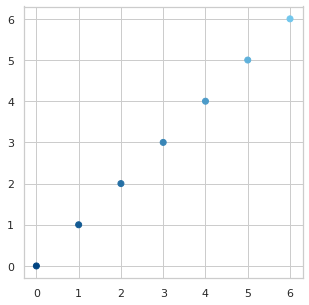

#ffe574 (1, 0.8980392156862745, 0.4549019607843138)
['#cc4c00', '#cf5607', '#d25f0e', '#d66916', '#d9721d', '#dc7c24', '#df852c', '#e28f33', '#e6993a', '#e9a241', '#ecac48', '#efb550', '#f2bf57', '#f5c85e', '#f9d266', '#fcdb6d']


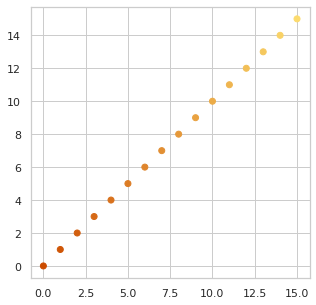

#8dffce (0.5529411764705883, 1, 0.807843137254902)
['#279e68']


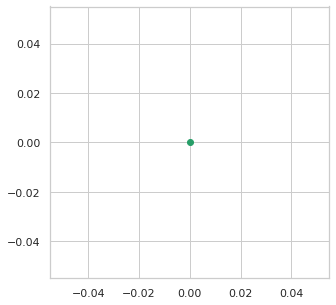

#ff8d8e (1, 0.5529411764705883, 0.5568627450980392)
['#a30000', '#b21818', '#c22f2f', '#d14647', '#e05e5f', '#f07676']


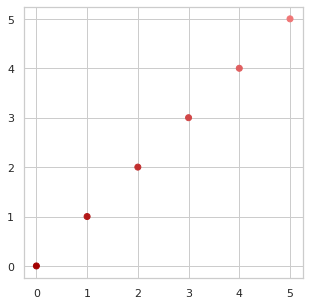

#ffa6ff (1, 0.6509803921568628, 1)
['#770dc9', '#861ecf', '#952fd5', '#a440db', '#b351e1', '#c362e7', '#d273ed', '#e184f3', '#f095f9']


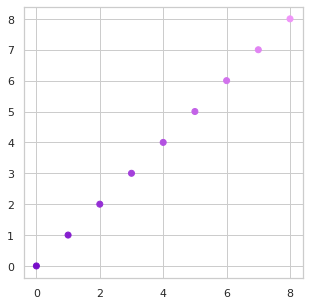

#f2bcb1 (0.9490196078431373, 0.7372549019607844, 0.6941176470588235)
['#592318', '#652f24', '#713b30', '#7c463b', '#885247', '#945e53', '#a06a5f', '#ab756a', '#b78176', '#c38d82', '#cf998e', '#daa499', '#e6b0a5']


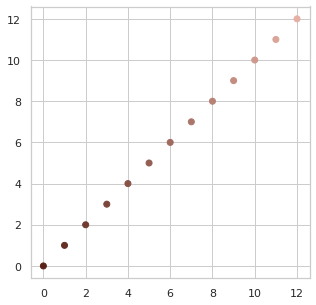

#ffddff (1, 0.8666666666666667, 1)
['#b0448f', '#b65098', '#bc5ca0', '#c267a9', '#c873b1', '#ce7fba', '#d48bc3', '#db96cb', '#e1a2d4', '#e7aedd', '#edbae5', '#f3c5ee', '#f9d1f6']


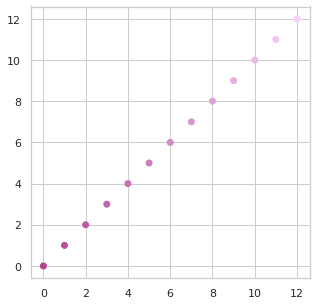

#ffffc7 (1, 1, 0.7803921568627451)
['#b5bd61']


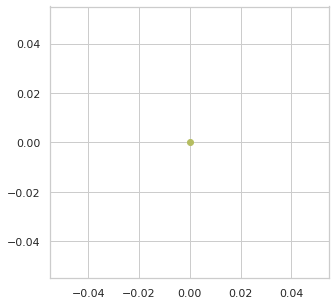

#7dffff (0.4901960784313726, 1, 1)
['#008b9c', '#3ec5ce']


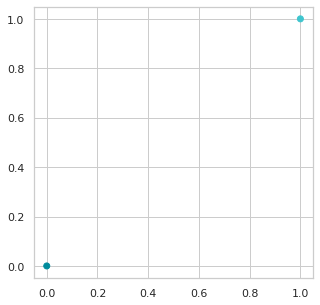

#ffffff (1, 1, 1)
['#7b94b5', '#bdcada']


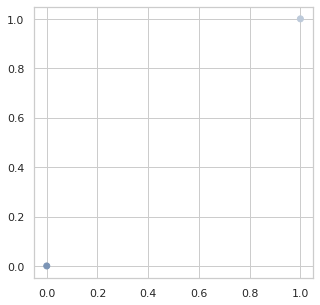

#ffffde (1, 1, 0.8705882352941177)
['#cc8845', '#d09252', '#d49c5e', '#d9a66b', '#ddb078', '#e1ba85', '#e6c392', '#eacd9e', '#eed7ab', '#f2e1b8', '#f6ebc5', '#fbf5d1']


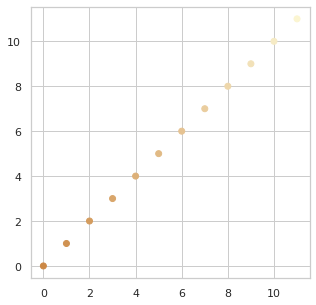

#fefff0 (0.996078431372549, 1, 0.9411764705882353)
['#65ac57', '#6fb261', '#79b76b', '#84bd76', '#8ec280', '#98c88a', '#a2cd94', '#acd39e', '#b7d8a9', '#c1deb3', '#cbe3bd', '#d5e9c7', '#dfeed1', '#eaf4dc', '#f4f9e6']


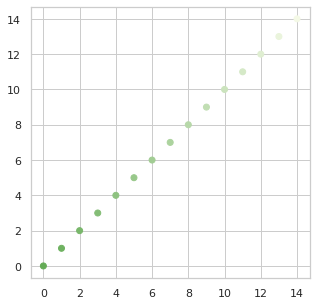

#fffefc (1, 0.996078431372549, 0.9882352941176471)
['#cc6563', '#d68482', '#e0a2a0', '#ebc1bf', '#f5dfdd']


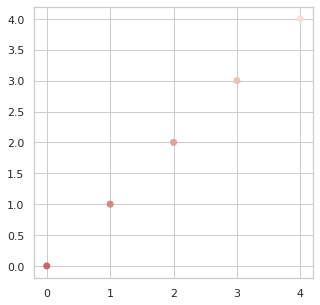

#ffffff (1, 1, 1)
['#927da2', '#9c89aa', '#a695b3', '#b0a0bb', '#baacc4', '#c4b8cc', '#cdc4d5', '#d7d0dd', '#e1dce6', '#ebe7ee', '#f5f3f7']


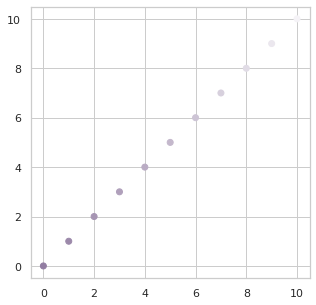

#fffffa (1, 1, 0.9803921568627452)
['#916961', '#a78780', '#bda59e', '#d3c3bd', '#e9e1db']


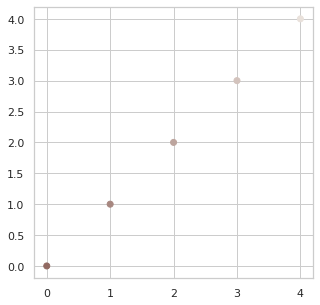

#ffffff (1, 1, 1)
['#c4839f', '#d3a2b7', '#e2c1cf', '#f0e0e7']


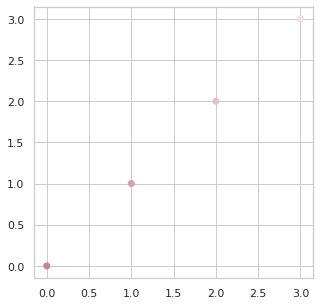

#fffff3 (1, 1, 0.9529411764705883)
['#a8a85a', '#b3b36d', '#bebe80', '#c9c993', '#d3d3a6', '#dedeba', '#e9e9cd', '#f4f4e0']


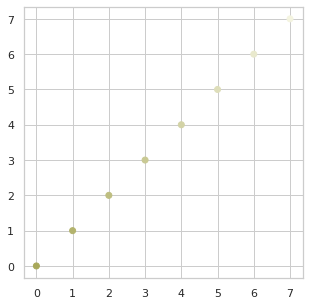

#ffffff (1, 1, 1)
['#6ba7b2', '#76aeb8', '#82b5be', '#8dbbc4', '#99c2ca', '#a4c9d0', '#afd0d6', '#bbd6db', '#c6dde1', '#d1e4e7', '#ddebed', '#e8f1f3', '#f4f8f9']


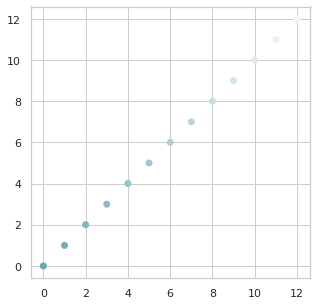

#ffafb0 (1, 0.6862745098039216, 0.6901960784313725)
['#7a1617', '#8b292a', '#9b3c3d', '#ac4f50', '#bc6264', '#cd7677', '#de898a', '#ee9c9d']


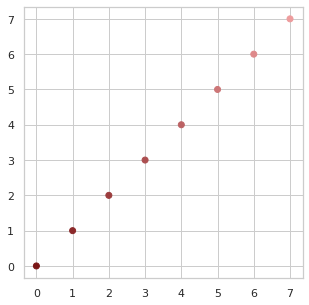

In [ ]:
pred1_c=[]
for c,n in zip(new_ad.uns['predict_colors'],pred_len):
    pred1_c+=ggcolor(c,r=0.4,n=n) 

In [ ]:
new_ad.uns['predict1_colors']=pred1_c

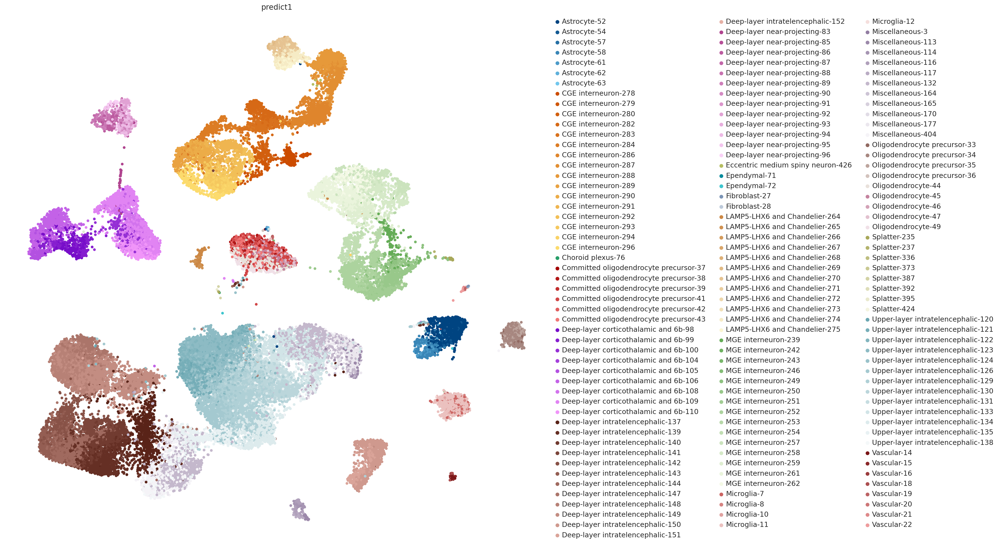

In [ ]:
figsize(18,18)
sc.pl.umap(new_ad,color=['predict1'],size=100,frameon=False,save='human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_subcelltype_s100.pdf')

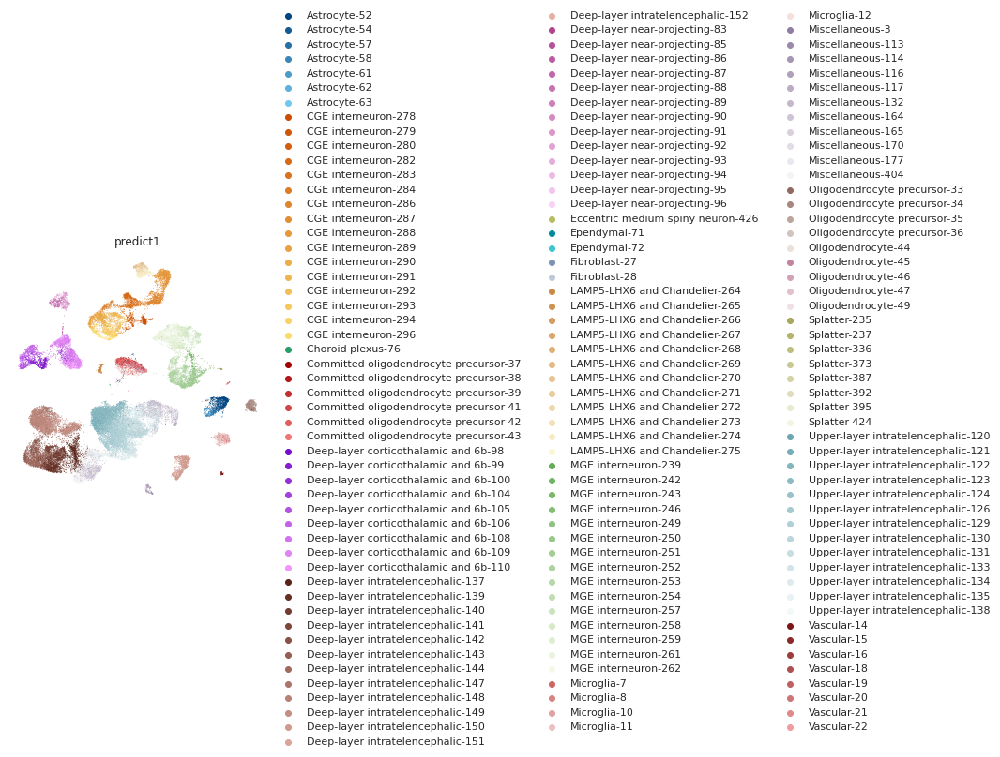

In [ ]:
sc.pl.umap(new_ad,color=['predict1'],frameon=False,save='human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_subcelltype.pdf')

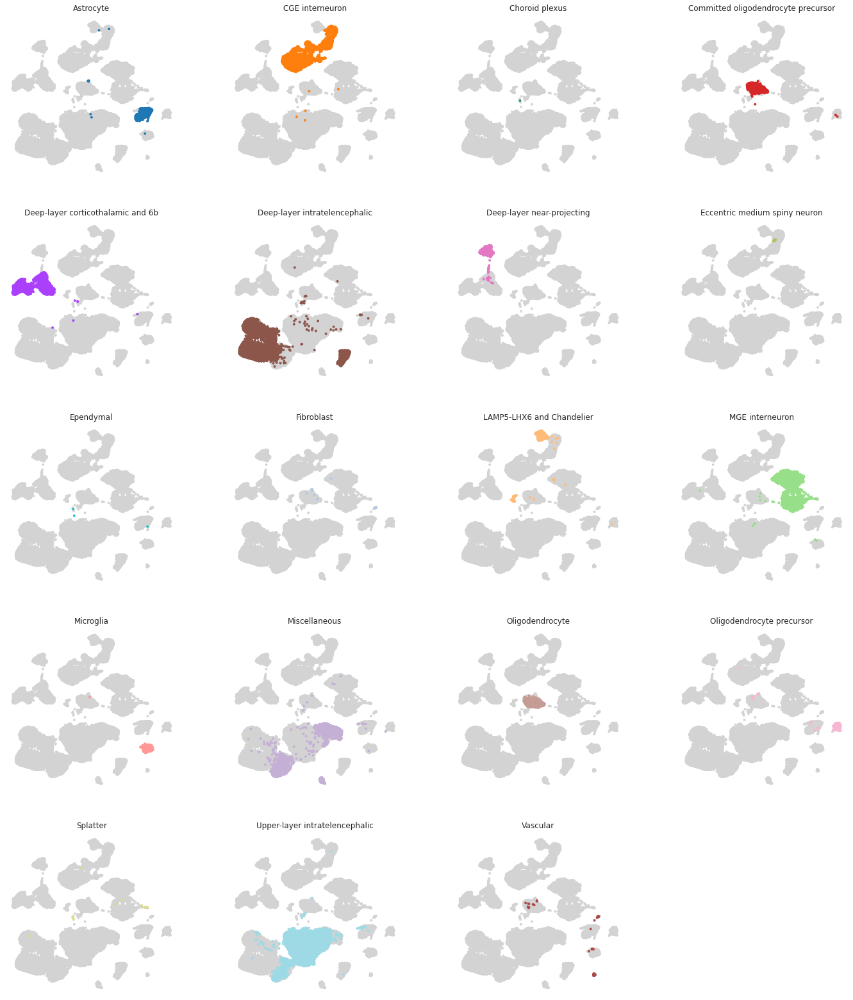

In [ ]:
cluster_small_multiples(new_ad,'predict')

## New color maps

In [ ]:
pred_len=[len(new_ad.obs.predict1[new_ad.obs.predict==i].unique()) for i in new_ad.obs.predict.cat.categories]

In [ ]:
pred_len

[16, 15, 9, 13, 13, 13, 12, 7, 6, 5, 4, 5, 11, 8]

In [ ]:
new_ad.uns['predict_colors']

['#DE3163',
 '#FF69B4',
 '#AA336A',
 '#FFB307',
 '#F33A6A',
 '#FFDF11',
 '#53A39D',
 '#AFE1AF',
 '#00B8C3',
 '#5C89CC',
 '#006091',
 '#F0E68C',
 '#A9A9A9',
 '#9A0F03']

#ff97c9 (1, 0.592156862745098, 0.7882352941176471)
['#ab0030', '#b0093a', '#b51343', '#bb1c4d', '#c02656', '#c52f60', '#ca3969', '#d04273', '#d54c7c', '#da5586', '#e05e90', '#e56899', '#ea71a3', '#ef7bac', '#f484b6', '#fa8ebf']


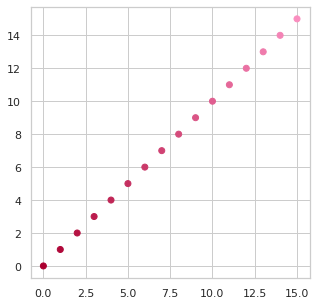

#ffcfff (1, 0.8117647058823529, 1)
['#cc3681', '#cf4089', '#d34a92', '#d6559a', '#da5fa3', '#dd69ab', '#e073b3', '#e47dbc', '#e788c4', '#eb92cd', '#ee9cd5', '#f1a6dd', '#f5b0e6', '#f8bbee', '#fcc5f7']


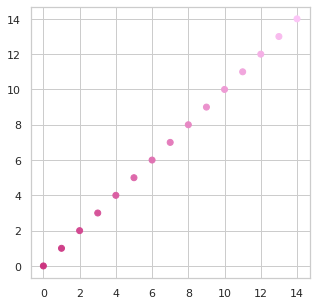

#ff99d0 (1, 0.6000000000000001, 0.8156862745098039)
['#770037', '#861148', '#952259', '#a4336a', '#b3447b', '#c3558c', '#d2669d', '#e177ae', '#f088bf']


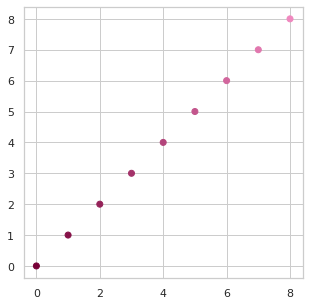

#ffff6d (1, 1, 0.4274509803921569)
['#cc8000', '#d08a08', '#d49411', '#d89d19', '#dca722', '#e0b12a', '#e4bb32', '#e7c43b', '#ebce43', '#efd84b', '#f3e254', '#f7eb5c', '#fbf565']


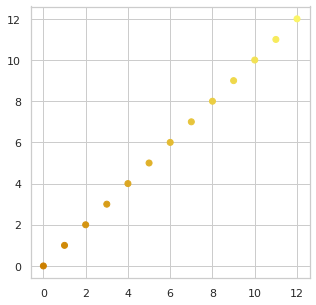

#ffa0d0 (1, 0.6274509803921569, 0.8156862745098039)
['#c00737', '#c51343', '#ca1f4f', '#cf2a5a', '#d33666', '#d84272', '#dd4e7e', '#e25989', '#e76595', '#ec71a1', '#f07dad', '#f588b8', '#fa94c4']


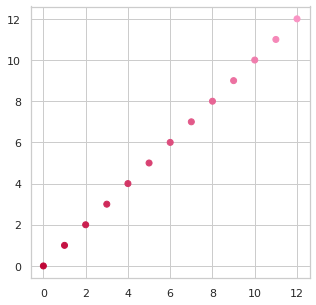

#ffff77 (1, 1, 0.4666666666666667)
['#ccac00', '#d0b209', '#d4b912', '#d8bf1b', '#dcc625', '#e0cc2e', '#e4d237', '#e7d940', '#ebdf49', '#efe552', '#f3ec5c', '#f7f265', '#fbf96e']


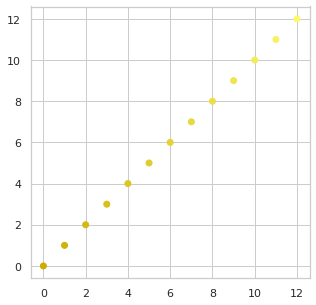

#b9ffff (0.7254901960784315, 1, 1)
['#20706a', '#2d7c76', '#398883', '#46948f', '#53a09c', '#60aca8', '#6cb8b4', '#79c3c1', '#86cfcd', '#93dbda', '#a0e7e6', '#acf3f3']


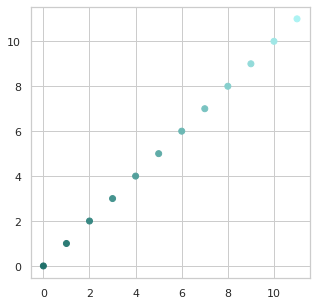

#ffffff (1, 1, 1)
['#7cae7c', '#8fba8f', '#a1c5a1', '#b4d1b4', '#c7dcc7', '#dae8da', '#ecf3ec']


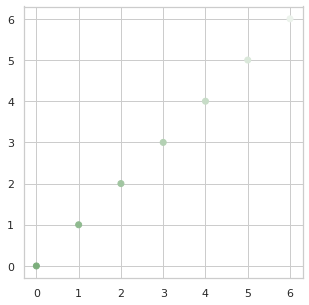

#66ffff (0.4, 1, 1)
['#008590', '#1199a2', '#22aeb5', '#33c2c8', '#44d6da', '#55ebec']


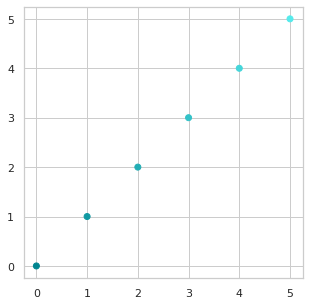

#c2efff (0.7607843137254902, 0.9372549019607843, 1)
['#295699', '#4875ad', '#6693c2', '#85b2d6', '#a3d0eb']


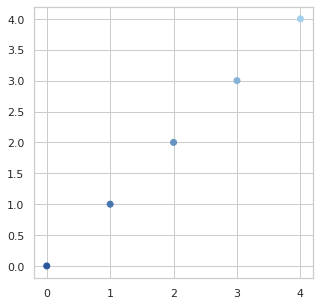

#66c6f7 (0.4, 0.7764705882352941, 0.9686274509803922)
['#002d5e', '#1a5384', '#337aab', '#4da0d1']


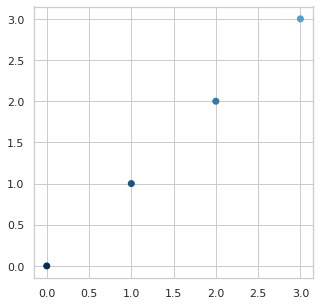

#fffff2 (1, 1, 0.9490196078431373)
['#bdb359', '#cac278', '#d7d196', '#e5e1b5', '#f2f0d3']


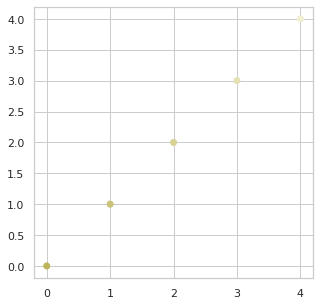

#ffffff (1, 1, 1)
['#767676', '#828282', '#8f8f8f', '#9b9b9b', '#a8a8a8', '#b4b4b4', '#c1c1c1', '#cdcdcd', '#dadada', '#e6e6e6', '#f3f3f3']


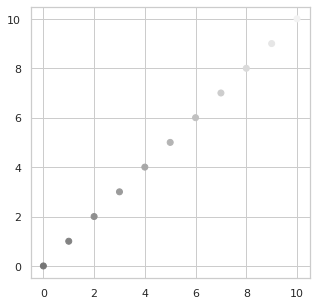

#ff7569 (1, 0.45882352941176474, 0.411764705882353)
['#670000', '#7a0f0d', '#8d1d1a', '#a02c27', '#b33a34', '#c64942', '#d9584f', '#ec665c']


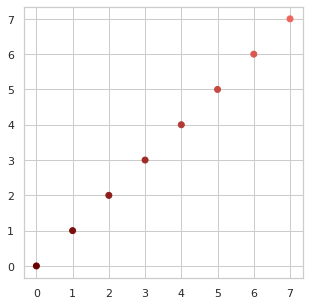

In [ ]:
pred1_c=[]
for c,n in zip(new_ad.uns['predict_colors'],pred_len):
    pred1_c+=ggcolor(c,r=0.4,n=n) 

In [ ]:
new_ad.uns['predict1_colors']=pred1_c

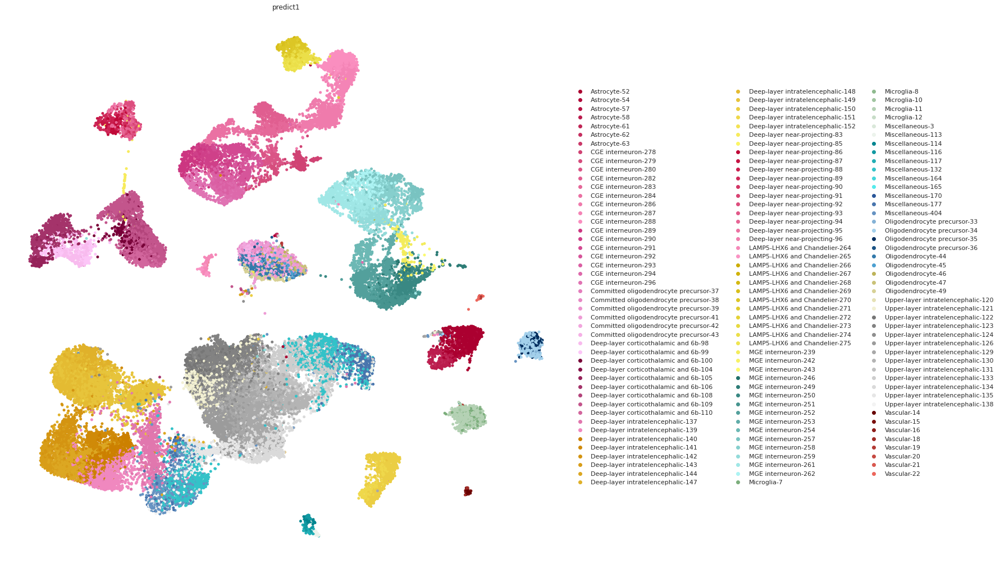

In [ ]:
figsize(18,18)
sc.pl.umap(new_ad,color=['predict1'],size=100,frameon=False,save='human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_subcelltype_s100_cc.pdf')

### Write out

In [ ]:
new_ad.write_h5ad('/home/huang_yin/projA/scBERT/data/results/human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_new.h5ad')

In [ ]:
new_ad.obs.to_csv('/home/huang_yin/projA/scBERT/data/results/human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq.csv')

## Read in

In [ ]:
new_ad=sc.read('/home/huang_yin/projA/scBERT/data/results/human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_new.h5ad')

In [ ]:
tmp=pd.Series(new_ad.uns['subclass_label_colors'])

In [ ]:
tmp.index=list(new_ad.obs.subclass_label.cat.categories)

In [ ]:
print(list(tmp[new_ad.obs.subclass_label.value_counts().index]))

['#279e68', '#d62728', '#9edae5', '#c49c94', '#b5bd61', '#aec7e8', '#dbdb8d', '#ff9896', '#1f77b4', '#17becf', '#8c564b', '#e377c2', '#98df8a', '#ffbb78', '#c5b0d5', '#aa40fc', '#ff7f0e', '#f7b6d2', '#ad494a']


In [ ]:
print(new_ad.uns['subclass_label_colors'])

['#1f77b4' '#ff7f0e' '#279e68' '#d62728' '#aa40fc' '#8c564b' '#e377c2'
 '#b5bd61' '#17becf' '#aec7e8' '#ffbb78' '#98df8a' '#ff9896' '#c5b0d5'
 '#c49c94' '#f7b6d2' '#dbdb8d' '#9edae5' '#ad494a']


In [ ]:
print(new_ad.uns['predict_colors'])

['#1f77b4', '#ff7f0e', '#279e68', '#d62728', '#aa40fc', '#8c564b', '#e377c2', '#b5bd61', '#17becf', '#aec7e8', '#ffbb78', '#98df8a', '#ff9896', '#c5b0d5', '#c49c94', '#f7b6d2', '#dbdb8d', '#9edae5', '#ad494a']


In [ ]:
print(new_ad.uns['predict1_colors'])

['#004481', '#135a93', '#2670a5', '#3986b7', '#4c9bc9', '#5fb1db', '#72c7ed', '#cc4c00', '#cf5607', '#d25f0e', '#d66916', '#d9721d', '#dc7c24', '#df852c', '#e28f33', '#e6993a', '#e9a241', '#ecac48', '#efb550', '#f2bf57', '#f5c85e', '#f9d266', '#fcdb6d', '#279e68', '#a30000', '#b21818', '#c22f2f', '#d14647', '#e05e5f', '#f07676', '#770dc9', '#861ecf', '#952fd5', '#a440db', '#b351e1', '#c362e7', '#d273ed', '#e184f3', '#f095f9', '#592318', '#652f24', '#713b30', '#7c463b', '#885247', '#945e53', '#a06a5f', '#ab756a', '#b78176', '#c38d82', '#cf998e', '#daa499', '#e6b0a5', '#b0448f', '#b65098', '#bc5ca0', '#c267a9', '#c873b1', '#ce7fba', '#d48bc3', '#db96cb', '#e1a2d4', '#e7aedd', '#edbae5', '#f3c5ee', '#f9d1f6', '#b5bd61', '#008b9c', '#3ec5ce', '#7b94b5', '#bdcada', '#cc8845', '#d09252', '#d49c5e', '#d9a66b', '#ddb078', '#e1ba85', '#e6c392', '#eacd9e', '#eed7ab', '#f2e1b8', '#f6ebc5', '#fbf5d1', '#65ac57', '#6fb261', '#79b76b', '#84bd76', '#8ec280', '#98c88a', '#a2cd94', '#acd39e', '#b7d8a9'

### Stack violin

### code for R DE gene

In [ ]:
%%R
library(sceasy)
ad = convertFormat("/home/huang_yin/projA/scBERT/data/results/human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_new.h5ad", from="anndata", to="seurat", outFile=NULL)
degdf <- lapply(c('Upper-layer intratelencephalic',
                  'Deep-layer intratelencephalic', 'CGE interneuron',
                  'MGE interneuron', 'Miscellaneous',
                  'Deep-layer corticothalamic and 6b',
                  'Committed oligodendrocyte precursor', 'Astrocyte',
                  'LAMP5-LHX6 and Chandelier', 'Deep-layer near-projecting',
                  'Oligodendrocyte precursor', 'Microglia', 'Oligodendrocyte',
                  'Vascular'),function(s)FindMarkers(ad,ident.1 = s, group.by = "predict",test.use = "wilcox",logfc.threshold = 0.1))
degdf1<-degdf[order(c('Upper-layer intratelencephalic',
        'Deep-layer intratelencephalic', 'CGE interneuron',
        'MGE interneuron', 'Miscellaneous',
        'Deep-layer corticothalamic and 6b',
        'Committed oligodendrocyte precursor', 'Astrocyte',
        'LAMP5-LHX6 and Chandelier', 'Deep-layer near-projecting',
        'Oligodendrocyte precursor', 'Microglia', 'Oligodendrocyte',
        'Vascular'))]
glst<-unlist(lapply(degdf1,function(x)row.names(head(x[order(x$avg_log2FC,decreasing = TRUE),],2)))) 
paste(glst, collapse="', '")

In [ ]:
new_ad=new_ad[new_ad.obs.predict.isin(['Upper-layer intratelencephalic',
                  'Deep-layer intratelencephalic', 'CGE interneuron',
                  'MGE interneuron', 'Miscellaneous',
                  'Deep-layer corticothalamic and 6b',
                  'Committed oligodendrocyte precursor', 'Astrocyte',
                  'LAMP5-LHX6 and Chandelier', 'Deep-layer near-projecting',
                  'Oligodendrocyte precursor', 'Microglia', 'Oligodendrocyte',
                  'Vascular'])]

In [ ]:
new_ad.obs['predict']=new_ad.obs['predict'].cat.reorder_categories(['Astrocyte', 'CGE interneuron',
       'Committed oligodendrocyte precursor',
       'Deep-layer corticothalamic and 6b',
       'Deep-layer intratelencephalic', 'Deep-layer near-projecting',
       'LAMP5-LHX6 and Chandelier', 'MGE interneuron', 'Microglia',
       'Miscellaneous', 'Oligodendrocyte', 'Oligodendrocyte precursor',
       'Upper-layer intratelencephalic', 'Vascular'])

In [ ]:
# create a dictionary to map each cell type to its category
cell_type_category = {'Astrocyte': 'non-neuron',
                      'CGE interneuron': 'neuron',
                      'Committed oligodendrocyte precursor': 'non-neuron',
                      'Deep-layer corticothalamic and 6b': 'neuron',
                      'Deep-layer intratelencephalic': 'neuron',
                      'Deep-layer near-projecting': 'neuron',
                      'LAMP5-LHX6 and Chandelier': 'neuron',
                      'MGE interneuron': 'neuron',
                      'Microglia': 'non-neuron',
                      'Miscellaneous': 'non-neuron',
                      'Oligodendrocyte': 'non-neuron',
                      'Oligodendrocyte precursor': 'non-neuron',
                      'Upper-layer intratelencephalic': 'neuron',
                      'Vascular': 'non-neuron'}

# sort the cell types by category
sorted_cell_types = sorted(cell_type_category.keys(), key=lambda x: cell_type_category[x])

# print the sorted cell types
print(sorted_cell_types)

['CGE interneuron', 'Deep-layer corticothalamic and 6b', 'Deep-layer intratelencephalic', 'Deep-layer near-projecting', 'LAMP5-LHX6 and Chandelier', 'MGE interneuron', 'Upper-layer intratelencephalic', 'Astrocyte', 'Committed oligodendrocyte precursor', 'Microglia', 'Miscellaneous', 'Oligodendrocyte', 'Oligodendrocyte precursor', 'Vascular']


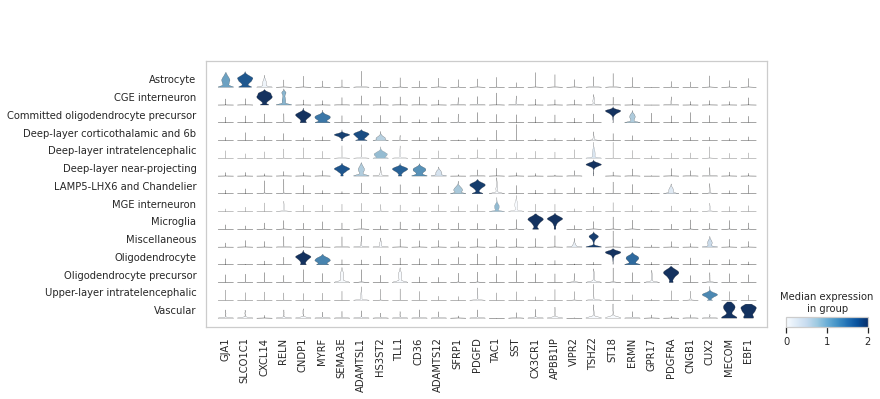

In [ ]:
sc.pl.stacked_violin(new_ad,var_names=['GJA1', 'SLCO1C1', 'CXCL14', 'RELN', 'CNDP1', 'MYRF', 'SEMA3E', 'ADAMTSL1', 'HS3ST2', 'TLL1', 'CD36', 'ADAMTS12', 'SFRP1', 'PDGFD', 'TAC1', 'SST', 'CX3CR1', 'APBB1IP', 'VIPR2', 'TSHZ2', 'ST18', 'ERMN', 'GPR17', 'PDGFRA', 'CNGB1', 'CUX2', 'MECOM', 'EBF1'],
              groupby='predict',vmax=2,save='stacked_violin_human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_originalvspred.pdf')

In [ ]:
new_ad.obs['predict']=new_ad.obs['predict'].cat.reorder_categories(['CGE interneuron', 'MGE interneuron','Deep-layer corticothalamic and 6b', 'Deep-layer intratelencephalic', 'Deep-layer near-projecting',  'Upper-layer intratelencephalic', 'LAMP5-LHX6 and Chandelier', 
                                                                    'Astrocyte', 'Committed oligodendrocyte precursor', 'Oligodendrocyte', 'Oligodendrocyte precursor', 'Microglia', 'Miscellaneous', 'Vascular'])

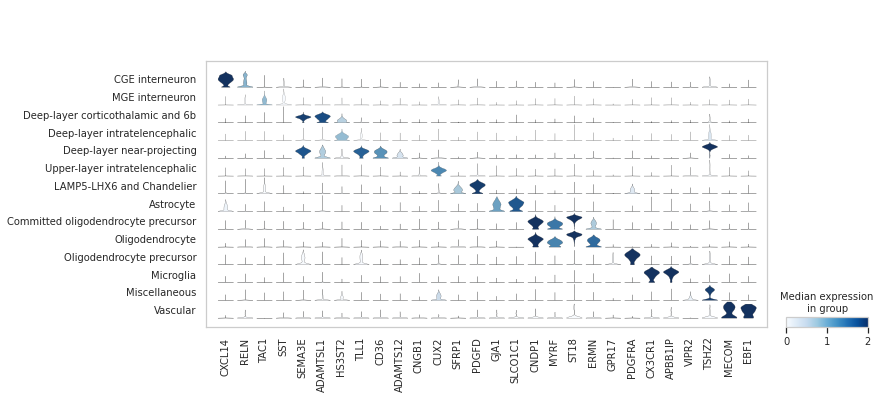

In [ ]:
sc.pl.stacked_violin(new_ad,var_names=['CXCL14', 'RELN', 'TAC1', 'SST', 'SEMA3E', 'ADAMTSL1', 'HS3ST2', 'TLL1', 'CD36', 'ADAMTS12', 'CNGB1', 'CUX2', 'SFRP1', 'PDGFD', 'GJA1', 'SLCO1C1', 'CNDP1', 'MYRF', 'ST18', 'ERMN', 'GPR17', 'PDGFRA', 'CX3CR1', 'APBB1IP', 'VIPR2', 'TSHZ2', 'MECOM', 'EBF1'],
              groupby='predict',vmax=2,save='stacked_violin_human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_originalvspred_v1.pdf')

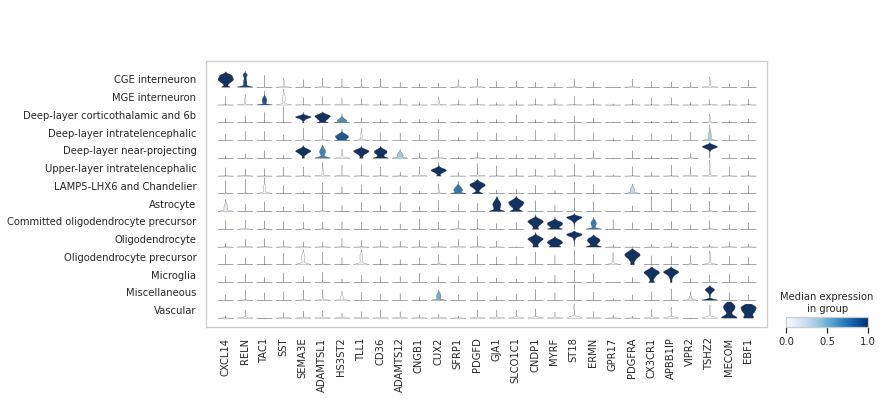

In [ ]:
sc.pl.stacked_violin(new_ad,var_names=['CXCL14', 'RELN', 'TAC1', 'SST', 'SEMA3E', 'ADAMTSL1', 'HS3ST2', 'TLL1', 'CD36', 'ADAMTS12', 'CNGB1', 'CUX2', 'SFRP1', 'PDGFD', 'GJA1', 'SLCO1C1', 'CNDP1', 'MYRF', 'ST18', 'ERMN', 'GPR17', 'PDGFRA', 'CX3CR1', 'APBB1IP', 'VIPR2', 'TSHZ2', 'MECOM', 'EBF1'],
              groupby='predict',vmax=1,save='stacked_violin_human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_originalvspred_v1.pdf')

# Sankey plot

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.colors as mcolors
from matplotlib.path import Path


class SankeyNode:
    '''
    This class defines and draws a single node in the sankey diagram. It shouldn't need to be created
    by the end user, but one may want to edit some properties after creation.

    For example, if you wanted to edit the label format of a single node to have more decimals:
        s = Sankey(flows)
        node = s.find_node(node_name)[0]
        node.label_format = '{label} {value:,.2f}'
    '''

    def __init__(self, x, y, width, height, name, value, 
                    label='', label_format='{label}\n{value:,.0f}', label_pos='left', label_pad_x=0.01, label_opts=dict(fontsize=14), 
                    align_y='top', color='#FF33AA',
                    artist_type='rectangle', **kwargs):
        '''
        @param x : left edge, typically the flow level, as a 0-indexed integer. 1 = distance between nodes 
        @param y : bottom edge, between [0, 1]
        @param width : 1 = distance between nodes
        @param height : total extent of axis is 1
        @param name : aunique name to refer to this node
        @param value : the value of this node
        @param align_y : how to align the flows that enter/exit the node. Options: {'top', 'top overlap'}
        @param color : any matplotlib color specifier
        @param label : alternative name to display. If not label, uses `name`
        @param label_format : format string that can optionally have 'label' and 'value' fields. Set to '' to remove labels
        @param label_pos : position of the label {'left', 'right', 'top', 'bottom', 'center'}
        @param label_pad_x : padding in x from the node, as fraction of distance between nodes
        @param label_opts : dictionary with additional options for the label. See matplotlib.axis.text() for options
        '''
        self.x = x
        self.y = y
        self.width = width
        self.height = height
        self.name = name
        self.value = value
        self.label = label or name
        self.label_format = label_format
        self.label_pos = label_pos
        self.label_pad_x = label_pad_x
        self.label_opts = label_opts
        self.artist_type = artist_type
        self.align_y = align_y
        self.color = color
        self.flow_pad = 0 # vertical padding between flow endpoints
        self.inflows = []
        self.outflows = []
        self.artist = None
        self.text = None


    def get_flow_y(self, i, side):
        '''
        Returns the (y_low, y_hi) position of flow i on the given side {'inflows', 'outflows'}
        '''
        flows = getattr(self, side)
        value_scale = self.value / (self.height - self.flow_pad * (len(flows) - 1))
        if self.align_y == 'top overlap':
            if len(flows) > 1 and (total := sum(x.value for x in flows)) > self.value:
                overlap = (total - self.value) / (len(flows) - 1) / value_scale
                y1 = self.y + self.height - (np.sum([x.value for x in flows[:i]]) / value_scale + (self.flow_pad - overlap) * i)
                y0 = y1 - flows[i].value / value_scale
                return (y0, y1)
            # else use 'top' below
        
        if 'top' in self.align_y:
            y1 = self.y + self.height - (np.sum([x.value for x in flows[:i]]) / value_scale + self.flow_pad * i)
            y0 = y1 - flows[i].value / value_scale
            return (y0, y1)
        else:
            raise NotImplementedError("align_y: " + self.align_y)

    def draw(self, ax):
        # Node
        if self.artist_type == 'rectangle':
            self.artist = mpatches.Rectangle((self.x, self.y), self.width, self.height)
        else:
            raise NotImplementedError("artist: {}".format(self.artist_type))
        self.artist.set_color(self.color)
        self.artist.set_edgecolor(None)
        ax.add_patch(self.artist)

        # Label
        if self.label_format:
            if self.label_pos == 'left':
                x = self.x - self.label_pad_x
                y = self.y + self.height / 2
                ha = 'right'
                va = 'center'
            elif self.label_pos == 'right':
                x = self.x + self.width + self.label_pad_x
                y = self.y + self.height / 2
                ha = 'left'
                va = 'center'
            elif self.label_pos == 'top':
                x = self.x + self.width / 2
                y = self.y + self.height
                ha = 'center'
                va = 'bottom'
            elif self.label_pos == 'bottom':
                x = self.x + self.width / 2
                y = self.y
                ha = 'center'
                va = 'top'
            elif self.label_pos == 'center':
                x = self.x + self.width / 2
                y = self.y + self.height / 2
                ha = 'center'
                va = 'center'
            else:
                raise ValueError("label_pos: " + self.label_pos)
            self.text = ax.text(x, y, self.label_format.format(label=self.label, value=self.value), ha=ha, va=va, **self.label_opts)



class SankeyFlow:
    '''
    This class defines and draws a single flow in the sankey diagram. It shouldn't need to be created
    by the end user, but one may want to edit some properties after creation.
    '''

    path_codes = [
        Path.MOVETO, # Top left
        Path.CURVE4,
        Path.CURVE4,
        Path.CURVE4, # Top right
        Path.LINETO, # Bottom right
        Path.CURVE4,
        Path.CURVE4,
        Path.CURVE4, # Bottom left
        Path.CLOSEPOLY
    ]

    def __init__(self, src, des, value, curvature = 0.3, color='#AAAAAA66', **kwargs):
        '''
        @param src : the source node
        @param des : the destination node
        @param value : value of the flow
        @param curvature : how curvy the flows are, with 0 = no curve and 1 = maximal curve
        @param color : Any matplotlib color specifier
        '''
        self.value = value
        self.curvature = curvature
        self.color = color
        self.node_pad = 0 # x padding from the node (sometimes they overlap), as fraction of distance between nodes in x
        self.artist = None

        self.src = src
        self.des = des
        self.src_i = len(src.outflows)
        self.des_i = len(des.inflows)
        src.outflows.append(self)
        des.inflows.append(self)


    def draw(self, ax):

        if self.src.artist_type != 'rectangle':
            raise NotImplementedError("artist: {}".format(self.src.artist_type))
        if self.des.artist_type != 'rectangle':
            raise NotImplementedError("artist: {}".format(self.des.artist_type))

        x1 = self.src.x + self.src.width + self.node_pad
        x2 = self.des.x - self.node_pad
        (y1_1, y1_2) = self.src.get_flow_y(self.src_i, 'outflows')
        (y2_1, y2_2) = self.des.get_flow_y(self.des_i, 'inflows')

        if self.curvature == 0:
            self.artist = mpatches.Polygon([
                [x1, y1_2], # top left
                [x2, y2_2], # top right
                [x2, y2_1], # bottom right
                [x1, y1_1], # bottom left
            ])
            self.artist.set_color(self.color)
            self.artist.set_edgecolor(None)
        else:
            poly_x1 = x1 + self.curvature * (x2 - x1)
            poly_x2 = x2 - self.curvature * (x2 - x1)
            path = Path([
                    [x1, y1_2], # top left
                    [poly_x1, y1_2], # top control 1
                    [poly_x2, y2_2], # top control 2
                    [x2, y2_2], # top right
                    [x2, y2_1], # bottom right
                    [poly_x2, y2_1], # bottom control 1
                    [poly_x1, y1_1], # bottom control 2
                    [x1, y1_1], # bottom left
                    [0, 0], # end
                ], SankeyFlow.path_codes)
            self.artist = mpatches.PathPatch(path, facecolor=self.color, linewidth=0)
            self.artist.set_edgecolor(None)
        
        ax.add_patch(self.artist)


class Sankey:
    '''
    This class creates and manages a sankey diagram. The typical workflow is:
        s = Sankey()
        s.sankey(flows, nodes)
        s.draw()
        plt.show()
    '''

    def __init__(self, flows=None, nodes=None, align_y='top', 
                    cmap=plt.cm.tab10, flow_color_mode='dest', flow_color_mode_alpha=0.6, 
                    node_width=0.03, node_height_pad_min=0, node_pad_y_min=0.01, node_pad_y_max=0.05,
                    node_opts={}, flow_opts={}, **kwargs):
        '''
        @param flows : see Sankey.sankey(). Can optionally input flows here as a shortcut
        @param nodes : see Sankey.sankey(). Can optionally input nodes here as a shortcut
        @param align_y : vertical alignment of the nodes {'top', 'center', 'bottom', 'justify', 'tree', 'tree clamp'}. If array-like, padding in each level
        @param cmap : colormap for default colors
        @param flow_color_mode : {'source', 'dest', 'lesser', 'greater', None}
                    'source', 'dest' : the flows will be colored the same as the source/destination node
                    'lesser', 'greater' : the flows will be colored as the node with the lesser/greater value 
        @param flow_color_mode_alpha : transparency of the flows
        @param node_width : width of the nodes, as fraction of distance between nodes
        @param node_height_pad_min : if node.height < node_height_pad_min, adds additional y padding. Value is a fraction of axis height. If array-like, padding in each level
        @param node_pad_y_min : minimum vertical padding between nodes, as fraction of distance between nodes. If array-like, padding in each level
        @param node_pad_y_max : maximum vertical padding between nodes, as fraction of distance between nodes. If array-like, padding in each level
        @param node_opts : a dictionary of options to SankeyNode() that is applied to all nodes
        @param flow_opts : a dictionary of options to SankeyFlow() that is applied to all flows
        '''
        self.align_y = align_y
        self.cmap = cmap
        self.flow_color_mode = flow_color_mode
        self.flow_color_mode_alpha = flow_color_mode_alpha
        self.node_width = node_width
        self.node_height_pad_min = node_height_pad_min
        self.node_pad_y_min = node_pad_y_min
        self.node_pad_y_max = node_pad_y_max
        self.node_opts = node_opts
        self.flow_opts = flow_opts

        self.nodes = [] # Nested list of SankeyNode, indexed by (node_level, i_node)
        self.flows = [] # List of SankeyFlows

        if flows or nodes:
            self.sankey(flows, nodes)

    def find_node(self, name):
        '''
        Finds the node with the given name and returns it and its level in the current diagram (node, level)
        '''
        for level,node_level in enumerate(self.nodes):
            for node in node_level:
                if node.name == name:
                    return (node, level)
        return (None, None)

    @staticmethod
    def infer_nodes(flows):
        '''
        Given a list of flows, automatically infers the nodes and returns them in a nested list which
        can be directly input into sankey(). The flows must not have loops or backwards flows.

        @param flows : See Sankey.sankey()
        '''
        from collections import defaultdict
        nodes = defaultdict(lambda: [0, 0, 0, set(), set()]) # min_level, in_value, out_value, parents, children
        max_level = 0

        for flow in flows:
            src = nodes[flow[0]]
            des = nodes[flow[1]]
            if des[0] <= src[0]:
                des[0] = src[0] + 1
                max_level = max(max_level, des[0])
            src[2] += flow[2]
            des[1] += flow[2]
            src[4].add(flow[1])
            des[3].add(flow[0])

        arr = [[] for _ in range(max_level+1)]
        for k,v in nodes.items():
            # maximize the level
            level = v[0]
            for child in v[4]:
                level = max(level, nodes[child][0] - 1)
            arr[level].append([k, max(v[1], v[2])])

        return arr

    def _get_opt(self, opt, level):
        '''
        Some options can be array-like, in which case index by node level
        '''
        val = getattr(self, opt)
        if isinstance(val, tuple) or isinstance(val, list):
            return val[level]
        else:
            return val

    def _value_scale_level(self, level, nodes_level):
        '''
        Finds the value scale such that this level ranges exactly from y=[0,1] including padding
        '''
        min_pad = self._get_opt('node_pad_y_min', level) * (len(nodes_level) - 1)
        heights = np.array([node[1] for node in nodes_level])
        scale = np.sum(heights) / (1 - min_pad)
        node_height_pad_min = self._get_opt('node_height_pad_min', level)
        if node_height_pad_min == 0:
            return scale
        else:
            if node_height_pad_min * len(nodes_level) + min_pad > 1:
                raise ValueError('sankey: node_height_pad_min {} is too large for level with size {}'.format(node_height_pad_min, len(nodes_level)))
            
            nsmall = 0
            while (smalls := heights / scale <= node_height_pad_min).any(): # any smalls left over = we need to increase the scale
                nsmall += np.count_nonzero(smalls)
                heights = heights[~smalls]
                scale = np.sum(heights) / (1 - min_pad - nsmall * node_height_pad_min)

            return scale

    def _level_node_max_padding(self, level, nodes_level, value_scale):
        '''
        @returns the max padding that can be used in this level
        '''
        if len(nodes_level) < 2:
            return 0
        heights = np.array([node[1] for node in nodes_level]) / value_scale
        level_value = np.sum(np.maximum(heights, self._get_opt('node_height_pad_min', level)))
        return (1 - level_value) / (len(nodes_level) - 1)

    def _get_node_ys(self, level, nodes_level, value_scale):
        '''
        Returns the y-positions of the nodes in a single level as (y_low, height)
        '''
        # Options
        align_y = self._get_opt('align_y', level)
        node_pad_y_min = self._get_opt('node_pad_y_min', level)
        node_pad_y_max = self._get_opt('node_pad_y_max', level)
        node_height_pad_min = self._get_opt('node_height_pad_min', level)

        # Get padding
        max_padding = self._level_node_max_padding(level, nodes_level, value_scale)
        if align_y == 'justify':
            node_pad_y = max_padding
        else:
            node_pad_y = min(max_padding, max(node_pad_y_max, node_pad_y_min))

        # Special case for n=1 with align = center or justify. align = top or bottom can use the general code below
        if len(nodes_level) == 1 and align_y in ['center', 'justify']:
            height = nodes_level[0][1] / value_scale
            pad = (1 - height) / 2
            return [(pad, height)]

        # General case
        ys = []
        if align_y == 'bottom':
            y = 0
            for node in reversed(nodes_level):
                height = node[1] / value_scale
                if height < node_height_pad_min:
                    pos = y + (node_height_pad_min - height) / 2
                    ys.insert(0, (pos, height))
                    y += node_height_pad_min + node_pad_y
                else:
                    ys.insert(0, (y, height))
                    y += actual_height + node_pad_y
        else:
            y = 1
            if align_y == 'center':
                y -= (max_padding - node_pad_y) * (len(nodes_level) - 1) / 2
            for node in nodes_level:
                height = node[1] / value_scale
                y -= height
                if height < node_height_pad_min:
                    y -= (node_height_pad_min - height) / 2
                    ys.append((y, height))
                    y -= (node_height_pad_min - height) / 2
                else:
                    ys.append((y, height))
                y -= node_pad_y
        return ys

    def sankey(self, flows, nodes=None):
        '''
        @param flows : A list of flows as (source_name, dest_name, value) or (source_name, dest_name, value, opts),
                       where opts is a dictionary containing arguments to SankeyFlow(). opts may also contain key flow_color_mode with 
                       the same meaning as in Sankey(), but applied only to this flow. 
        @param nodes : A list of node levels, from sources to destinations. In each level, a list of nodes as (name, value) or (name, value, opts),
                       where opts is a dictionary containing arguments to SankeyNode().
        '''

        if not nodes:
            nodes = self.infer_nodes(flows)
            

        # Get scaling. The widest level should extend exactly from y = 0 to 1 including padding
        widest_level = 0
        value_scale = 0
        for level,nodes_level in enumerate(nodes):
            scale = self._value_scale_level(level, nodes_level)
            if scale > value_scale:
                value_scale = scale
                widest_level = level

        # Nodes
        self.nodes = []
        i_color = 0 # for automatic coloring
        for level,nodes_level in enumerate(nodes):
            arr = [] # nodes in this level
            ys = self._get_node_ys(level, nodes_level, value_scale)
            for node,(y,height) in zip(nodes_level, ys):
                # Error check
                if node[1] < 0:
                    print('Warning: Node has value < 0: {}'.format(node))

                # Node configuration
                args = dict(color=self.cmap(i_color % self.cmap.N))
                args.update(self.node_opts) # global options
                if len(node) > 2:
                    args.update(node[2]) # individual options

                # Create node
                arr.append(SankeyNode(level, y, self.node_width, height, node[0], node[1], **args))
                i_color += 1
            self.nodes.append(arr)

        # Flows
        self.flows = []
        for flow in flows:
            (src, src_level) = self.find_node(flow[0])
            (des, des_level) = self.find_node(flow[1])

            # Error check
            if not src:
                raise KeyError("Bad flow - couldn't find souce node: {}".format(flow))
            if not des:
                raise KeyError("Bad flow - couldn't find destination node: {}".format(flow))
            if flow[2] > src.value or flow[2] > des.value or flow[2] < 0:
                print("Warning: Bad flow - bad weight: {}".format(flow))
            if des_level <= src_level:
                raise ValueError("Bad flow - flow is backwards: {}".format(flow))

            # Auto color
            custom_opts = flow[3] if len(flow) > 3 else {}
            flow_color_mode = custom_opts.get('flow_color_mode', self.flow_color_mode)
            if 'dest' in flow_color_mode:
                color = des.color
            elif 'source' in flow_color_mode:
                color = src.color
            elif 'lesser' in flow_color_mode:
                color = src.color if src.value < des.value else des.color
            elif 'greater' in flow_color_mode:
                color = src.color if src.value > des.value else des.color
            else:
                color = '#AAAAAA'
            color = mcolors.to_rgba(color)
            color = (*color[:3], color[3] * self.flow_color_mode_alpha)
            
            # Create flow
            args = dict(color=color)
            args.update(self.flow_opts)
            args.update(custom_opts)
            self.flows.append(SankeyFlow(src, des, flow[2], **args))

        # Post-creation layout
        if isinstance(self.align_y, list) or isinstance(self.align_y, tuple) or 'tree' in self.align_y:
            self._layout_tree(widest_level)
    

    def _layout_tree_level(self, level, right):
        '''
        @param right : This level is right of the max level, and will base the ideal positions off of the nodes' parents. Otherwise, uses the children.
        '''
        # Options
        align_y = self._get_opt('align_y', level)
        if 'tree' not in align_y: return
        node_pad_y_min = self._get_opt('node_pad_y_min', level)
        node_height_pad_min = self._get_opt('node_height_pad_min', level)
        nodes_level = self.nodes[level]

        # Get the ideal y position such that the flows are horizontal. For nodes with a single parent,
        # this is simply the y of the flow. For nodes with multiple parents, use a weighted average.
        y_ideal = np.zeros(len(nodes_level))
        has_stress = np.ones(len(nodes_level), dtype=bool)
        for i,node in enumerate(nodes_level):
            node.y = 0 # needed when we call get_flow_y below
            total_ys = 0
            total_weights = 0
            for flow in node.inflows if right else node.outflows:
                if right:
                    y_anchor = flow.src.get_flow_y(flow.src_i, "outflows")[0]
                    y_flow_node = node.get_flow_y(flow.des_i, "inflows")[0] # since we set y to 0 above, this is the position of the flow in the node
                else:
                    y_anchor = flow.des.get_flow_y(flow.des_i, "inflows")[0]
                    y_flow_node = node.get_flow_y(flow.src_i, "outflows")[0] # since we set y to 0 above, this is the position of the flow in the node
                y_ideal_node = np.clip(y_anchor - y_flow_node, 0, 1)
                total_ys += y_ideal_node * flow.value
                total_weights += flow.value
            if total_weights > 0:
                y_ideal[i] = total_ys / total_weights
            else:
                has_stress[i] = False

        # Get the maximum height each node can have
        y_max = np.zeros(len(nodes_level))
        y = 1
        for i,node in enumerate(nodes_level):
            if node.height < node_height_pad_min:
                y_max[i] = y - (node_height_pad_min + node.height) / 2
                y -= node_height_pad_min + node_pad_y_min
            else:
                y_max[i] = y - node.height
                y -= node.height + node_pad_y_min
        y_flex = y_max[-1] # amount of extra y space available

        # Start the nodes from their maximum (top) position, then calculate the amount of "stress" each node
        # has to reach its ideal position. Large stress = wants to move down, negative stress = wants to move up.
        # If a single node wants to push down but the ones below it want to move up, we want to average
        # the stresses such that no node is too selfish. So use a weighted average of all nodes below it.
        y_stress = (y_max - y_ideal) * has_stress
        average_stress = (np.cumsum(y_stress[::-1]) / np.maximum(1, np.cumsum(has_stress[::-1])))[::-1]
        y_desired_shift = np.minimum(y_stress, average_stress)
        if 'clamp' in align_y: # we can clip here to ensure height of plot = 1 = widest layer, but not clipping looks fine too
            y_desired_shift = np.clip(y_desired_shift, 0, y_flex) 
        y_shift = np.maximum.accumulate(y_desired_shift) # if one node pushes down, the subsequent nodes must follow by at least as much
        y_new = y_max - y_shift

        # Set the new positions
        for node,pos in zip(nodes_level, y_new):
            node.y = pos

    def _layout_tree(self, max_level):
        '''
        Adjusts the positions of self.nodes to group sibling nodes next to each other and their parent. Works best when the nodes form
        a tree structure. This should be called after the flows are created but before draw(). 

        The algorithm starts from max_level and works its way out in both directions. Note that the ordering of the nodes
        (in top-to-bottom order) always takes precedence.  

        NB: Assumes max_level is set by default option in _get_node_ys()
        '''
        for level in range(max_level + 1, len(self.nodes)):
            self._layout_tree_level(level, True)
        for level in range(max_level - 1, -1, -1):
            self._layout_tree_level(level, False)

    def draw(self, ax=None):
        # Get axes
        if ax is None:
            ax = plt.gca()

        # Draw nodes
        for node_level in self.nodes:
            for node in node_level:
                node.draw(ax)

        # Draw flow
        for flow in self.flows:
            flow.draw(ax)

        #ax.axis(xmin=0, xmax=len(self.nodes)-1 + self.node_width, ymin=0, ymax=1)
        ax.axis('tight')
        ax.axis('off')

In [ ]:
tmp=pd.Series(new_ad.uns['subclass_label_colors'])

In [ ]:
tmp.index=list(new_ad.obs.subclass_label.cat.categories)

In [ ]:
for i in new_ad.obs[['subclass_label', 'predict']].value_counts().items():
    print(i)

(('IT', 'Upper-layer intratelencephalic'), 10350)
(('IT', 'Deep-layer intratelencephalic'), 9322)
(('VIP', 'CGE interneuron'), 3525)
(('PVALB', 'MGE interneuron'), 2635)
(('L6 CT', 'Deep-layer corticothalamic and 6b'), 2549)
(('SST', 'MGE interneuron'), 2328)
(('L4 IT', 'Upper-layer intratelencephalic'), 2203)
(('IT', 'Miscellaneous'), 2167)
(('LAMP5', 'CGE interneuron'), 1682)
(('L4 IT', 'Miscellaneous'), 1518)
(('Oligodendrocyte', 'Committed oligodendrocyte precursor'), 1199)
(('Astrocyte', 'Astrocyte'), 1169)
(('L6b', 'Deep-layer corticothalamic and 6b'), 1079)
(('L5/6 IT Car3', 'Deep-layer intratelencephalic'), 1051)
(('L5/6 NP', 'Deep-layer near-projecting'), 815)
(('OPC', 'Oligodendrocyte precursor'), 771)
(('Microglia', 'Microglia'), 744)
(('LAMP5', 'LAMP5-LHX6 and Chandelier'), 744)
(('Oligodendrocyte', 'Oligodendrocyte'), 701)
(('PAX6', 'CGE interneuron'), 325)
(('PVALB', 'LAMP5-LHX6 and Chandelier'), 161)
(('L5 ET', 'Miscellaneous'), 158)
(('Endothelial', 'Vascular'), 70)
(('

In [ ]:
tmp=new_ad.obs.groupby(['subclass_label', 'predict']).size()
left_cols=pd.Series(new_ad.uns['subclass_label_colors'],index=new_ad.obs.subclass_label.cat.categories)
right_cols=pd.Series(new_ad.uns['predict_colors'],index=new_ad.obs.predict.cat.categories)
flows=[]
nodes=[[],[]]
#for i in new_ad.obs[['subclass_label', 'predict']].value_counts().items():
for i in tmp.items():
    if i[1]>0:
        flows.append((i[0][0]+' ',i[0][1],i[1]))
        
for i in new_ad.obs.subclass_label.value_counts().items():
    nodes[0].append((i[0]+' ',i[1],{'label_pos':'right','label_format':'{label}','label_opts':dict(fontsize=10),'color':left_cols[i[0]]}))
for i in new_ad.obs.predict.value_counts().items():
    nodes[1].append((i[0],i[1],{'label_pos':'left','label_format':'{label}','label_opts':dict(fontsize=10),'color':right_cols[i[0]]}))

In [ ]:
       
tmp=new_ad.obs.groupby(['subclass_label', 'predict']).size()
    for i in tmp.items():
        if i[1]>0:
            flows.append((i[0][0],i[0][1]+' ',i[1]))

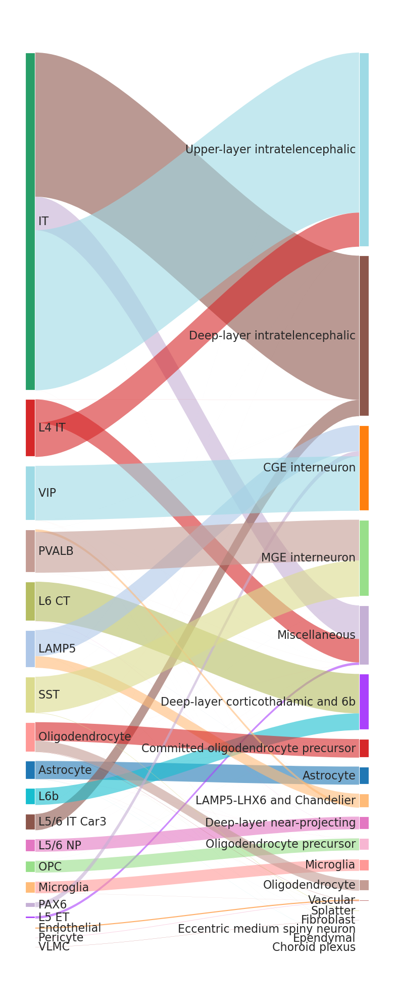

<Figure size 480x1280 with 0 Axes>

In [ ]:
figsize(6,16)
s = Sankey(flows=flows,nodes=nodes, flow_color_mode='lesser')
s.draw()
plt.show()
plt.savefig('figures/sankey_human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq.pdf')

# plot

In [ ]:
tmp=new_ad.obs.groupby(['subclass_label', 'predict']).size()
left_cols=pd.Series(new_ad.uns['subclass_label_colors'],index=new_ad.obs.subclass_label.cat.categories)
right_cols=pd.Series(new_ad.uns['predict_colors'],index=new_ad.obs.predict.cat.categories)
flows=[]
nodes=[[],[]]
#for i in new_ad.obs[['subclass_label', 'predict']].value_counts().items():
for i in tmp.items():
    if i[1]>0:
        flows.append((i[0][0]+' ',i[0][1],i[1]))
        
for i in new_ad.obs.subclass_label.value_counts().items():
    if i[1]<2000:
        nodes[0].append((i[0]+' ',2000,{'label_pos':'left','label_format':'{label}','label_opts':dict(fontsize=18),'color':left_cols[i[0]]}))
    else:
        nodes[0].append((i[0]+' ',i[1],{'label_pos':'left','label_format':'{label}','label_opts':dict(fontsize=18),'color':left_cols[i[0]]}))
for i in new_ad.obs.predict.value_counts().items():
    if i[1]<2000:
        nodes[1].append((i[0],2000,{'label_pos':'right','label_format':'{label}','label_opts':dict(fontsize=18),'color':right_cols[i[0]]}))
    else:
        nodes[1].append((i[0],i[1],{'label_pos':'right','label_format':'{label}','label_opts':dict(fontsize=18),'color':right_cols[i[0]]}))

('Upper-layer intratelencephalic', 12556)
('Deep-layer intratelencephalic', 10384)
('CGE interneuron', 5532)
('MGE interneuron', 4963)
('Miscellaneous', 3851)
('Deep-layer corticothalamic and 6b', 3629)
('Committed oligodendrocyte precursor', 1203)
('Astrocyte', 1172)
('LAMP5-LHX6 and Chandelier', 907)
('Deep-layer near-projecting', 822)
('Oligodendrocyte precursor', 784)
('Microglia', 745)
('Oligodendrocyte', 701)
('Vascular', 122)
('Splatter', 36)
('Fibroblast', 17)
('Eccentric medium spiny neuron', 4)
('Ependymal', 3)
('Choroid plexus', 1)


In [ ]:
'top', 'center', 'bottom', 'justify', 'tree', 'tree clamp'

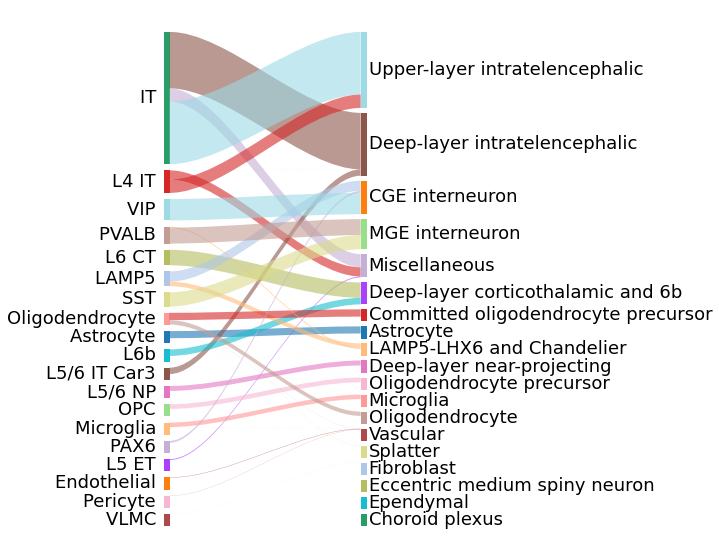

In [ ]:
figsize(4,10)
s = Sankey(flows=flows,nodes=nodes, flow_color_mode='lesser',align_y='justify')
s.draw()
plt.savefig('figures/sankey_human_brain_MultipleCorticalAreas_AllenBrain_2019_SMART-Seq_v1.pdf',dpi=300, bbox_inches='tight',transparent=True)